## Introduction

Instead of ignoring my growing collection of food photos, I chose to treat it as a personal dataset that documents different aspects of my daily life. Each image implicitly records what I ate, where I was, and the context in which the meal happened, capturing details about environment, presentation, and social setting. Given that the assignment centers on personal digital archives, I chose this topic and built a pipeline around these images to study their visual patterns in a more systematic way.

This project builds an end-to-end pipeline that turns raw JPEGs from my personal archive into structured data, then compresses each image into a low-dimensional representation using two deep models: a convolutional autoencoder (CAE) and a variational autoencoder (VAE). Both models are trained to reconstruct the original images from a latent vector, but the VAE additionally imposes a probabilistic structure on the latent space. On top of these learned representations, I apply classical techniques such as principal component analysis (PCA) and k-means clustering to organize meals into visually coherent groups.

The goal of this assignment is to build and evaluate an end-to-end pipeline on my own digital archive of food photos. In this project, I use that pipeline to learn compact image representations, cluster visually similar meals, and compare how different models capture structure in my data.

## Loading raw images

In [ ]:
# Standard library
import os
import glob
import random
import math

# Core scientific stack
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import rgb_to_hsv
import seaborn as sns

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K

# scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, mean_squared_error

# Reproducibility
random.seed(42)
np.random.seed(42)

I mounted my Google Drive to access the folder with all the images. I set a fixed target resolution of 128×128 pixels with 3 color channels so that every image would have the same shape for the models. Then I used `glob` to collect all file paths that match this pattern and sorted them to get a stable ordering. The printout shows that this step found 569 image files.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Path to the images
DATA_GLOB = "/content/drive/MyDrive/food_images/*"

# Target image size
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 3
TARGET_SIZE = (IMG_WIDTH, IMG_HEIGHT)   # PIL uses (width, height)

In [ ]:
# Collect all image paths
image_paths = sorted(glob.glob(DATA_GLOB))

print(f"Found {len(image_paths)} image files.")
image_paths[:10]

Found 569 image files.


['/content/drive/MyDrive/food_images/01ABB14B-7FA2-43C6-83EA-5D7F1EE0B1A7_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/04D815BE-3905-4DDF-A9E2-5259211A2A1F_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/04E32FFC-567F-450F-B20C-C0D26E043A37_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/057248DA-87C3-4AAC-B36D-9B79E743A258_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/05D4B527-9EEC-484B-886B-ABD97B1E9365_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0719C9D7-1F9E-4AED-A6AB-B81BF8B437DA_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0813A2B5-E3B5-44CC-8A0D-2D9BEB0A3007_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/08EC11C4-EA23-45B1-82F2-381FB4FCD903_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0BCB7385-B0A5-40EF-933F-05A1AFB5959F_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0D343749-4E82-4C5D-9577-0F5D7C70E097_4_5005_c.jpeg']

Next, I load the images into memory and standardize their format. I iterate over all file paths, open each image with PIL, record its original size, convert it to RGB, and resize it to the common 128×128 resolution before storing it as a `uint8` NumPy array. Stacking this list yields the array `X_raw` with shape `(569, 128, 128, 3)`, which is the base tensor I use for all later preprocessing and modeling.

In [ ]:
# Utility function to load a single image
def load_image(path, target_size=TARGET_SIZE):
    """
    Load an image from disk, convert to RGB, resize,
    and return as a uint8 numpy array of shape (H, W, 3).
    """
    img = Image.open(path)

    # Ensure 3 channels
    img = img.convert("RGB")

    # Resize to target size
    img = img.resize(target_size)

    # Convert to numpy array
    arr = np.array(img, dtype=np.uint8)
    return arr

In [ ]:
# Load all images into memory
images_list = []
original_sizes = []

for p in image_paths:
    try:
        img = Image.open(p)
        original_sizes.append(img.size)          # (width, height) before resizing
        img = img.convert("RGB").resize(TARGET_SIZE)
        images_list.append(np.array(img, dtype=np.uint8))
    except Exception as e:
        print(f"Skipping {p} due to error: {e}")

# Stack into a single array
X_raw = np.stack(images_list, axis=0)
print("X_raw shape:", X_raw.shape)

X_raw shape: (569, 128, 128, 3)


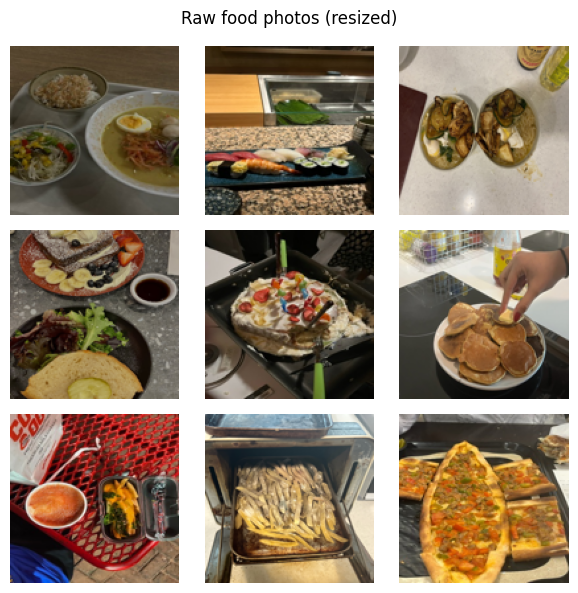

In [ ]:
# Visualize a random 3x3 grid of raw images
def show_image_grid(images, n_rows=3, n_cols=3, title="Sample raw images"):
    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    indices = random.sample(range(len(images)), min(n_rows * n_cols, len(images)))
    for i, idx in enumerate(indices):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(images[idx])
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

show_image_grid(X_raw, title="Raw food photos (resized)")

This output shows a random 3×3 grid of the resized food images after loading and standardizing them to 128×128 RGB. It shows the visual diversity of the dataset with different lighting conditions, backgrounds, and plate layouts.

## Data Pre-Processing

Now, I convert the raw uint8 images into float32 and rescale pixel values from `[0, 255]` to `[0, 1]`, which is the standard range for training neural networks in Keras. This normalization keeps all features on a comparable scale, improves numerical stability during optimization, and makes the outputs of the CAE and VAE easier to interpret. The resulting tensor `X_proc` has shape `(569, 128, 128, 3)`, and I store `n_original` as the number of original (pre-augmentation) images.

In [ ]:
# Normalize raw images to float32 in [0,1] and record number of originals
X_proc = X_raw.astype("float32") / 255.0
print("X_proc shape:", X_proc.shape, "dtype:", X_proc.dtype)

n_original = X_proc.shape[0]

X_proc shape: (569, 128, 128, 3) dtype: float32


To increase the effective size and diversity of the dataset, I apply standard image data augmentation using Keras’ `ImageDataGenerator`.

In [ ]:
# Augment each original image N_AUG_PER_IMAGE times
N_AUG_PER_IMAGE = 2  # 2 augmented versions per original

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode="nearest"
)

n_original = X_proc.shape[0]
n_to_generate = n_original * N_AUG_PER_IMAGE

print(f"Original images: {n_original}")
print(f"Augmented images to generate: {n_to_generate}")

augmented_images = []

if n_to_generate > 0:
    batch_size = 32
    aug_iter = datagen.flow(X_proc, batch_size=batch_size, shuffle=True)

    while len(augmented_images) * batch_size < n_to_generate:
        batch = next(aug_iter)
        augmented_images.append(batch)

    X_aug = np.concatenate(augmented_images, axis=0)[:n_to_generate]
else:
    X_aug = np.empty((0, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=X_proc.dtype)

print("X_aug shape:", X_aug.shape)

# Combine original and augmented images
X_all = np.concatenate([X_proc, X_aug], axis=0)
print("X_all shape:", X_all.shape)

Original images: 569
Augmented images to generate: 1138
X_aug shape: (1138, 128, 128, 3)
X_all shape: (1707, 128, 128, 3)


In [ ]:
X_all = np.concatenate([X_proc, X_aug], axis=0)
print("X_all shape:", X_all.shape)

# X_proc: originals only
n_original = X_proc.shape[0]   # number of real images

# Keep a view of original images only for analysis
X_orig = X_all[:n_original]    # first n_original are the originals

X_all shape: (1707, 128, 128, 3)


The generator is configured with small random rotations (±15°), horizontal and vertical shifts (up to 10% of image size), slight zoom in/out (±10%), and horizontal flips, with `fill_mode="nearest"` to fill any empty pixels created by these transforms. These operations are subtle enough to keep the underlying content of each photo (it is still the same meal), but they introduce variation in viewpoint, framing, and local distortions.

Given that I only have 569 original images, I choose to generate 2 augmented versions per image. This triples the total number of samples, which is helpful for training convolutional models without making the dataset so large that training becomes very slow. Generating many more copies would give limited additional benefit, since the transforms are only small perturbations of the same photo.

After deciding to create two augmented versions per original image, I let `ImageDataGenerator` produce new samples in mini-batches until I reach the required total number of augmented images. I then stack all of these batches into a single array `X_aug` with the same shape and value range as the originals, so every augmented photo is just another 128×128×3 image in `[0, 1]`. I connect the original and augmented arrays together along the sample axis to form `X_all` (1707 images in total), which is the dataset I use to train both the CAE and the VAE. During training I treat originals and augments the same, because I want the models to be robust to small geometric changes.

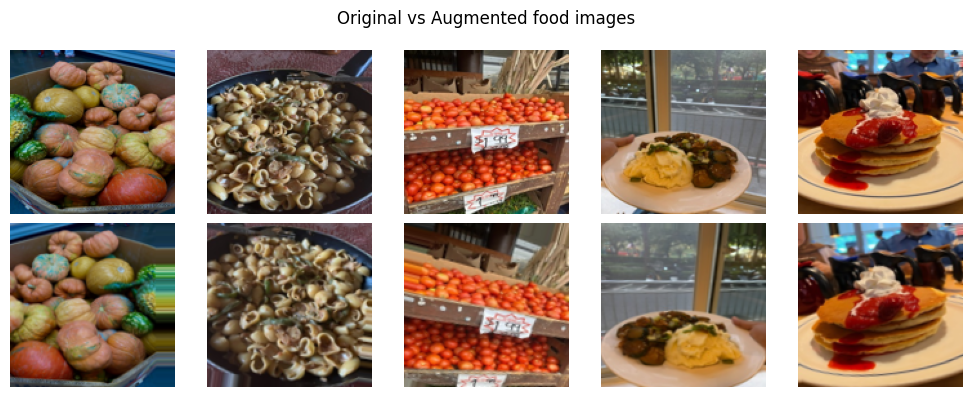

In [ ]:
# Visualize a few original images and their augmented versions side by side
n_show = 5

indices = random.sample(range(n_original), n_show)
original_sample = X_proc[indices]

tmp_gen = datagen.flow(original_sample, batch_size=n_show, shuffle=False)
aug_sample = next(tmp_gen)

plt.figure(figsize=(n_show * 2, 4))

for i in range(n_show):
    plt.subplot(2, n_show, i + 1)
    plt.imshow(original_sample[i])
    plt.axis("off")
    if i == 0:
        plt.ylabel("Original")

    plt.subplot(2, n_show, n_show + i + 1)
    plt.imshow(aug_sample[i])
    plt.axis("off")
    if i == 0:
        plt.ylabel("Augmented")

plt.suptitle("Original vs Augmented food images")
plt.tight_layout()
plt.show()

The output shows each original on the top row and its augmented counterpart directly below. The content of the meal is the same, but there are small changes in angle, position, and framing.

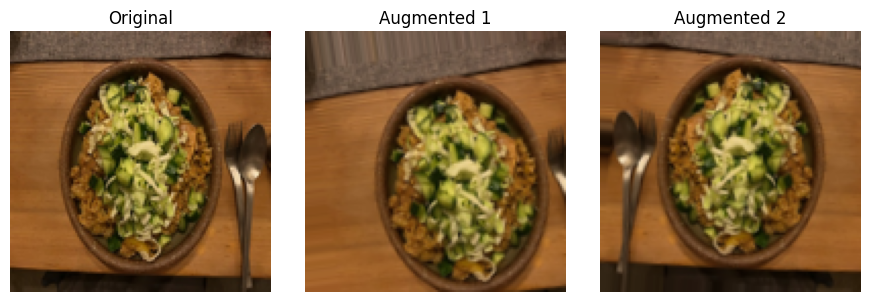

In [ ]:
# Show one random image and two augmented copies
idx = np.random.randint(0, n_original)
base_img = X_proc[idx:idx+1]   # shape (1, 128, 128, 3)

# build a tiny generator for just this image
single_gen = datagen.flow(base_img, batch_size=1, shuffle=False)

aug1 = next(single_gen)[0]
aug2 = next(single_gen)[0]

plt.figure(figsize=(9, 3))

plt.subplot(1, 3, 1)
plt.imshow(base_img[0])
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(aug1)
plt.title("Augmented 1")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(aug2)
plt.title("Augmented 2")
plt.axis("off")

plt.tight_layout()
plt.show()

I zoom in on a single example to see exactly how augmentation changes one image. In this case, the augmented images show small shifts and rotations relative to the original, but the overall scene and composition are clearly preserved.

## Exploratory Data Analysis

Now, let's summarize basic image-level statistics (brightness, contrast, and color balance in both RGB and HSV space) to understand the overall lighting conditions and color patterns in my food photo dataset before fitting any models.

In [ ]:
sns.set(style="whitegrid")

# X_proc  -> normalized originals in [0,1]
# X_aug   -> augmented images
# X_all   -> concatenation of originals + augmented
# n_original -> number of original images

print("Original images:", n_original)
print("Augmented images:", X_all.shape[0] - n_original)
print("Total images (X_all):", X_all.shape)

Original images: 569
Augmented images: 1138
Total images (X_all): (1707, 128, 128, 3)


I want a quick numerical summary of the lighting conditions in my dataset, since brightness and contrast can heavily influence what the models learn. For each image I compute two scalar features: the mean pixel value across all channels (overall brightness) and the standard deviation of pixel values (a proxy for contrast).

Brightness: min = 0.0992068 max = 0.734196 mean = 0.41553235
Contrast:   min = 0.095492385 max = 0.32964888 mean = 0.22519849


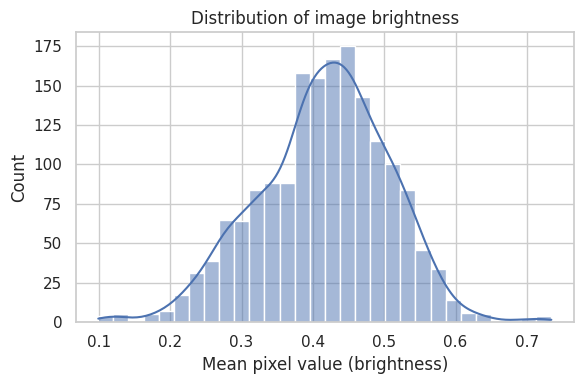

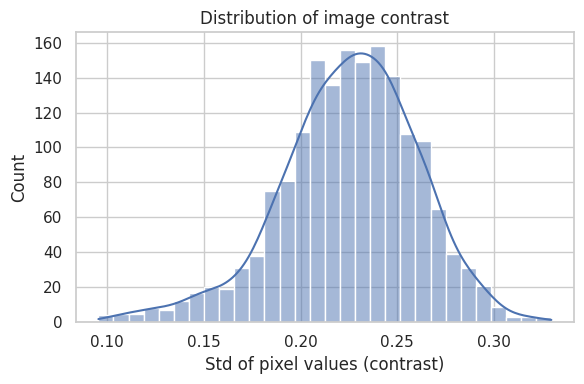

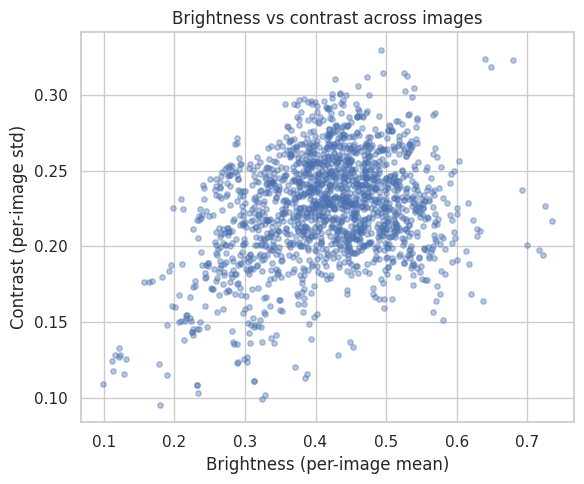

In [ ]:
# mean pixel value per image across all channels (overall brightness)
image_brightness = X_all.mean(axis=(1, 2, 3))

# standard deviation per image across all channels (proxy for contrast)
image_contrast = X_all.std(axis=(1, 2, 3))

print("Brightness: min =", image_brightness.min(),
      "max =", image_brightness.max(),
      "mean =", image_brightness.mean())

print("Contrast:   min =", image_contrast.min(),
      "max =", image_contrast.max(),
      "mean =", image_contrast.mean())

# Histogram of brightness
plt.figure(figsize=(6,4))
sns.histplot(image_brightness, bins=30, kde=True)
plt.xlabel("Mean pixel value (brightness)")
plt.ylabel("Count")
plt.title("Distribution of image brightness")
plt.tight_layout()
plt.show()

# Histogram of contrast
plt.figure(figsize=(6,4))
sns.histplot(image_contrast, bins=30, kde=True)
plt.xlabel("Std of pixel values (contrast)")
plt.ylabel("Count")
plt.title("Distribution of image contrast")
plt.tight_layout()
plt.show()

# Scatter: brightness vs contrast
plt.figure(figsize=(6,5))
plt.scatter(image_brightness, image_contrast, alpha=0.4, s=15)
plt.xlabel("Brightness (per-image mean)")
plt.ylabel("Contrast (per-image std)")
plt.title("Brightness vs contrast across images")
plt.tight_layout()
plt.show()


In the brightness histogram, the x-axis is the mean pixel value per image (0 = black, 1 = white). Values range roughly from 0.10 to 0.73, with an average around 0.42. The distribution is unimodal and fairly symmetric, peaking around 0.4–0.45. Most food photos live in a mid-brightness range: not very dark, not washed out. There are a few darker images (e.g. low-lit restaurants) and a few very bright ones (white table, strong lighting).

In the contrast histogram, the x-axis is the per-image standard deviation of pixel values, which I use as a proxy for contrast. Contrast ranges from about 0.10 to 0.33, with a mean around 0.23. Again the distribution is single-peaked and roughly bell-shaped. Most images have moderate contrast wiht enough variation between light and dark regions. A few images are unusually low-contrast (likely bad lighting or blur) and a few are high-contrast (strong highlights/shadows), but they are rare. Overall, the dataset has reasonably consistent but still different lighting.

On the scatter plot, each point is one image with x-axis being the mean brightness and y-axis is the contrast. Most points sit in a band around brightness 0.3–0.5 and contrast 0.2–0.27 which is the same pattern as we saw in the histogram. There is a weak positive trend where as images get brighter, their contrast tends to increase slightly. There are also some outliers, such some dark, low-contrast shots on the left (probably badly lit restaurant photos) and some bright, low-contrast ones toward the right-bottom (overexposed or white table).

To understand the color balance of the dataset, I compute the mean and standard deviation of each RGB channel across all images and then examine the distribution of per-image channel means. This shows whether my photos are biased toward warmer (red/orange) or cooler tones.

Channel means (R,G,B): [0.48381194 0.40455016 0.32202876]
Channel stds  (R,G,B): [0.2389543  0.22766271 0.22947474]


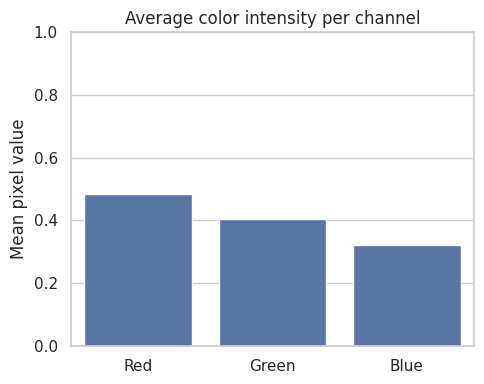

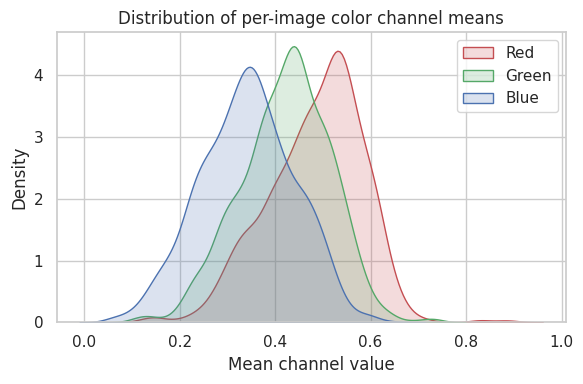

In [ ]:
# Compute per-channel stats over all images
channel_means = X_all.mean(axis=(0,1,2))
channel_stds  = X_all.std(axis=(0,1,2))

print("Channel means (R,G,B):", channel_means)
print("Channel stds  (R,G,B):", channel_stds)

# Barplot of channel means
plt.figure(figsize=(5,4))
sns.barplot(x=["Red","Green","Blue"], y=channel_means)
plt.ylim(0,1)
plt.ylabel("Mean pixel value")
plt.title("Average color intensity per channel")
plt.tight_layout()
plt.show()

# Per-image channel means (shape: N x 3)
per_image_channel_means = X_all.mean(axis=(1,2))

plt.figure(figsize=(6,4))
for c, color, name in zip(range(3), ["r","g","b"], ["Red","Green","Blue"]):
    sns.kdeplot(per_image_channel_means[:, c], label=name, color=color, fill=True, alpha=0.2)
plt.xlabel("Mean channel value")
plt.title("Distribution of per-image color channel means")
plt.legend()
plt.tight_layout()
plt.show()

The bar chart shows the average intensity of each RGB channel across all images: red ≈ 0.48, green ≈ 0.40, blue ≈ 0.32 (on the [0,1] scale). Thus, the dataset is warm-biased with the reds being the strongest. It makes sense with my data because I have lots of skin tones, wood tables and warm indoo lighting. The printed standard deviations are similar across channels (~0.23), which means each color varies a fair amount.

The KDE curves show the distribution of per-image means for each channel. Red and green have peaks around 0.45–0.55 and 0.40–0.45 respectively, so most images are saturated in warm colors with some darker and brighter outliers. For the autoencoders, this implies they’ll mostly see warm, food-typical color palettes, but still with enough variation across channels.

Now, I move from RGB to the HSV color space for a random subset of images, so I can separately analyze how saturated and bright my photos are and how those two properties relate across the dataset.

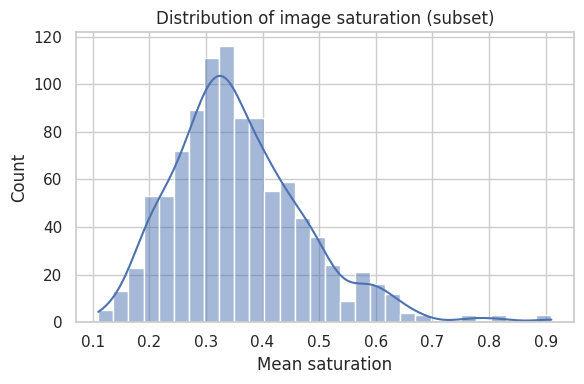

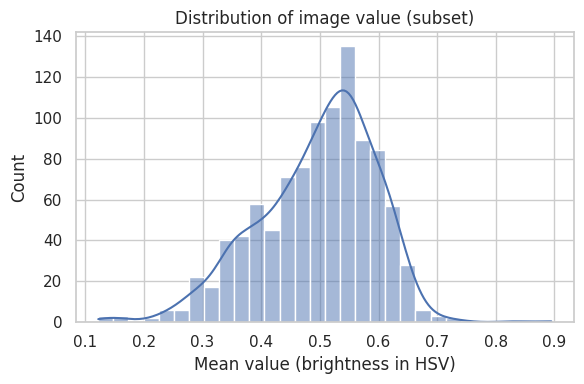

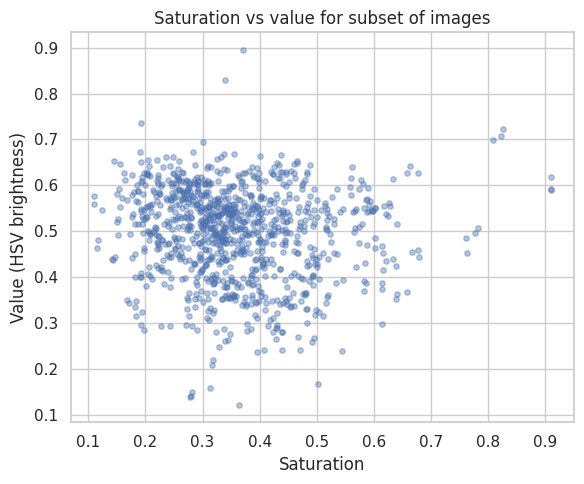

In [ ]:
# Convert a subset to HSV for analysis
max_samples = min(1000, X_all.shape[0])
indices_hsv = np.random.choice(X_all.shape[0], size=max_samples, replace=False)
rgb_subset = X_all[indices_hsv]  # still in [0,1]

# reshape to (-1, 3), convert to HSV, then back to image shape
rgb_flat = rgb_subset.reshape(-1, 3)
hsv_flat = rgb_to_hsv(rgb_flat)
hsv_subset = hsv_flat.reshape(rgb_subset.shape)

# H,S,V per image
image_saturation = hsv_subset[...,1].mean(axis=(1,2))
image_value      = hsv_subset[...,2].mean(axis=(1,2))

plt.figure(figsize=(6,4))
sns.histplot(image_saturation, bins=30, kde=True)
plt.xlabel("Mean saturation")
plt.title("Distribution of image saturation (subset)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
sns.histplot(image_value, bins=30, kde=True)
plt.xlabel("Mean value (brightness in HSV)")
plt.title("Distribution of image value (subset)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,5))
plt.scatter(image_saturation, image_value, alpha=0.4, s=15)
plt.xlabel("Saturation")
plt.ylabel("Value (HSV brightness)")
plt.title("Saturation vs value for subset of images")
plt.tight_layout()
plt.show()

The top histogram shows the distribution of mean saturation per image in HSV space. Most photos cluster around saturation 0.3–0.4, with a long right tail up to ~0.8–0.9. That means the typical meal shot uses moderately saturated colors. The left side doesn’t go very close to zero, so there are relatively few grayish images.

The second histogram does the same for value (brightness) and peaks around 0.5–0.6, again with a fairly tight spread. Most photos are taken in good lighting rather than in near-darkness places. So, the dataset is in a fairly consistent saturation/brightness state, which is good news for the models.

The scatterplot shows mean saturation vs mean value (brightness) for the HSV subset. Most points are about saturation 0.25-0.4 and value 0.45-0.6, which matches the pattern in the histogram. So, the dataset does not split into bright and dark states, it is one main cluster. For the models, that means that color intensity and brightness are not providing clear separate “modes” on their own and the interesting structure will probably come from shapes, textures, and composition.

## PCA and Clustering Baseline

I start by reducing the hand-crafted image features into a lower-dimensional space using PCA. This step helps simplify the feature set by keeping only the directions that capture the most variance, which removes noise and makes patterns easier to observe.

Once the data is compressed into a small number of principal components, I apply k-means clustering to see whether the images naturally group into meaningful categories based on these simplified features. This forms a baseline: it tells me how well a traditional, non-deep-learning approach can separate the images before introducing more complex models like autoencoders. If PCA+k-means already produced clear, interpretable clusters, then deep models might not be necessary. But if the clusters turn out weak or inconsistent, it indicates that the dataset requires a richer, nonlinear representation, something trained models like CAEs and VAEs are much better at capturing.

Since each 128×128×3 image has 49,152 pixels, I first subsample at most 1,000 images from the full dataset so that the computation runs quickly. I reshape each image from `(H, W, C)` into a long vector of length `H*W*C`, which gives a matrix of shape `(N, 49152)` that PCA can operate on. I fit a PCA model with 50 components, which projects each image into a 50-dimensional space and records how much variance each component explains. This setup lets me compare how much structure a purely linear model can capture, before moving on to nonlinear autoencoders.

The cumulative explained variance plot shows how much of the total pixel-level variance is captured as more principal components are added. The curve rises quickly for the first few components, showing that a small number of PCs already capture a substantial portion of variation across images. After that, the curve increases more gradually and approaches about 65–70% by 50 components, without a sharp elbow. That means that even though many pixels are redundant, no single simple pattern explains most of the differences between images, so the visual variation is spread across many directions rather than being driven by just one or two dominant factors. Then, using 50 components is a reasonable choice because it reduces dimensionality by a factor of almost 1000.

Flattened subset shape: (1000, 49152)


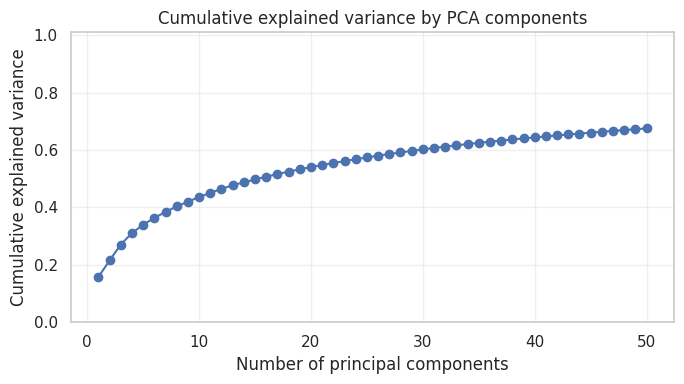

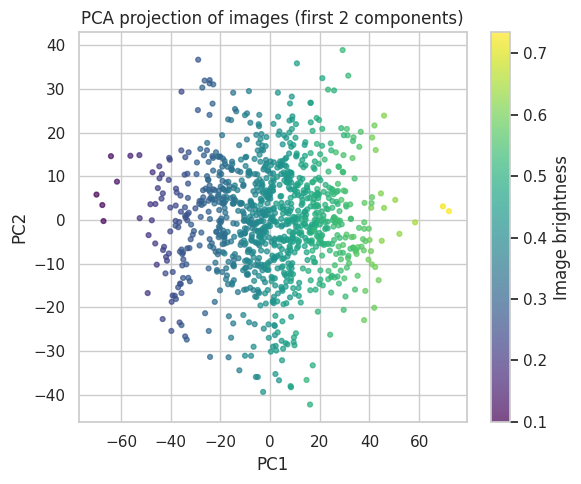

In [ ]:
# Use a subset for PCA so it fits in memory
max_pca_samples = min(1000, X_all.shape[0])
indices_pca = np.random.choice(X_all.shape[0], size=max_pca_samples, replace=False)
X_pca_subset = X_all[indices_pca]

# Flatten images into vectors: (N, H*W*3)
N, H, W, C = X_pca_subset.shape
X_flat = X_pca_subset.reshape(N, H * W * C)

print("Flattened subset shape:", X_flat.shape)

# Fit PCA
n_components = 50
pca = PCA(n_components=n_components, random_state=42)
X_pca = pca.fit_transform(X_flat)

expl_var_ratio = pca.explained_variance_ratio_
cum_expl_var = np.cumsum(expl_var_ratio)

# Explained variance plot
plt.figure(figsize=(7,4))
plt.plot(range(1, n_components+1), cum_expl_var, marker="o")
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.ylim(0,1.01)
plt.grid(alpha=0.3)
plt.title("Cumulative explained variance by PCA components")
plt.tight_layout()
plt.show()

# 2D scatter of first two principal components, colored by brightness
subset_brightness = image_brightness[indices_pca]

plt.figure(figsize=(6,5))
sc = plt.scatter(X_pca[:,0], X_pca[:,1],
                 c=subset_brightness, cmap="viridis", s=12, alpha=0.7)
plt.colorbar(sc, label="Image brightness")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA projection of images (first 2 components)")
plt.tight_layout()
plt.show()

The scatterplot of the first two principal components provides a 2D visualization of this embedding, with points colored by the mean brightness of each image. What’s interesting is that the points form a smooth left-to-right color gradient, with darker images clustering on the left and brighter ones on the right. This means that image brightness ends up being one of the dominant sources of variance. But the photos still differ in subtle ways (texture, angle, background).

Additionally, I looked at the images with the smalles and largest scores along each component. For PC1, the extremes make a lot of sense visually. The “low PC1” images are much darker and taken in dim indoor settings, while the “high PC1” images are bright and shot with strong lighting. This is the same thing we saw with the scatter plot. PC1 is acting as a brightness  or lighting direction while the PC2 is more about composition or scene layout.

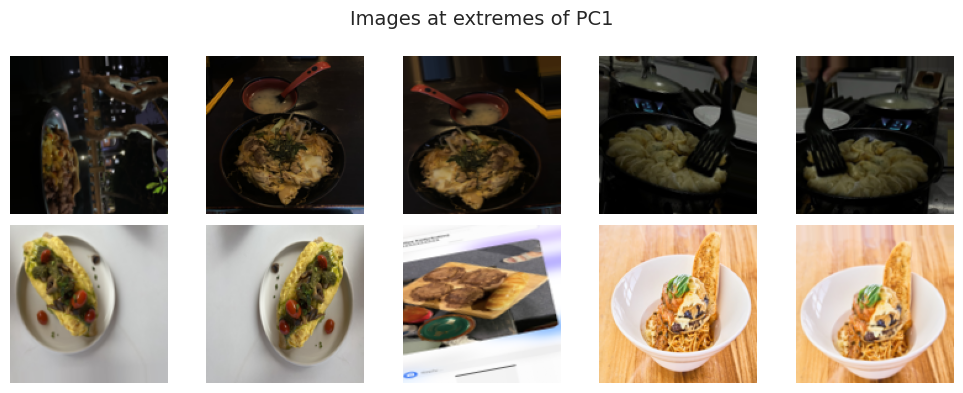

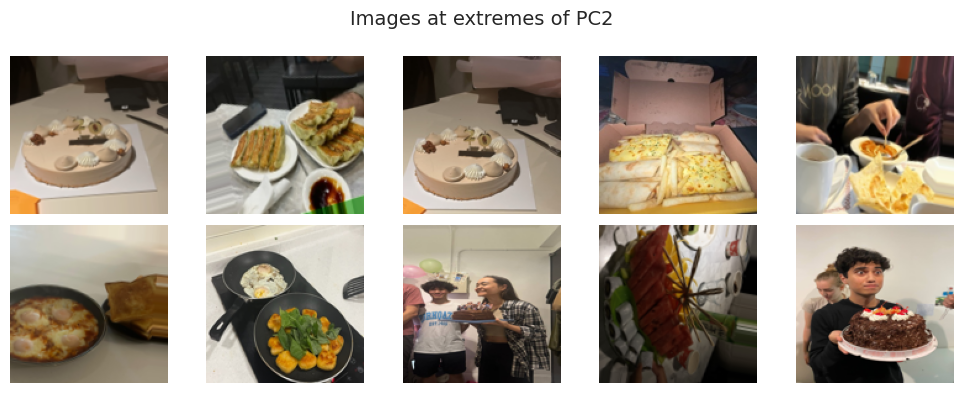

In [ ]:
# PCA on subset
X_flat_subset = X_pca_subset.reshape(N, H * W * C)
pca_subset = PCA(n_components=50, random_state=42)
X_pca_subset_coords = pca_subset.fit_transform(X_flat_subset)

def show_extreme_images(component_index=0, k=5):
    """
    Show images with smallest and largest scores along a given PCA component.
    component_index: which principal component (0-based)
    k: number of images at each extreme to display
    """
    scores = X_pca[:, component_index]
    sorted_idx = np.argsort(scores)

    lowest_idx = sorted_idx[:k]
    highest_idx = sorted_idx[-k:]

    fig, axes = plt.subplots(2, k, figsize=(2*k, 4))
    fig.suptitle(f"Images at extremes of PC{component_index+1}", fontsize=14)

    for i in range(k):
        img_low = X_pca_subset[lowest_idx[i]]
        img_high = X_pca_subset[highest_idx[i]]

        axes[0, i].imshow(img_low)
        axes[0, i].axis("off")
        if i == 0:
            axes[0, i].set_ylabel("Lowest", fontsize=12)

        axes[1, i].imshow(img_high)
        axes[1, i].axis("off")
        if i == 0:
            axes[1, i].set_ylabel("Highest", fontsize=12)

    plt.tight_layout()
    plt.show()

show_extreme_images(component_index=0, k=5)
show_extreme_images(component_index=1, k=5)

PC1 clearly separates darker, low-light food photos from brighter images with clean, well-lit compositions. PC2 appears to pick up differences in scene complexity (from simple photos to photos with multiple objects or people).

To get a simple baseline for how much structure is present in my image dataset without using any neural networks, I first apply PCA directly to the flattened pixel vectors. Each 128×128×3 image becomes a long vector of 49,152 values, so PCA lets me project these high-dimensional images into a much lower-dimensional space. The code flattens each image into a long vector and standardizes the pixel values so PCA can treat every dimension on the same scale. Then, it fits a PCA model with 50 components, transforming all images into this lower-dimensional space so we can see how much of the dataset’s total variation each component captures.

In [ ]:
# X_all: (N, H, W, C) in [0,1]
N, H, W, C = X_all.shape
print("X_all:", X_all.shape)

X_all: (1707, 128, 128, 3)


PCA-transformed shape: (1707, 50)


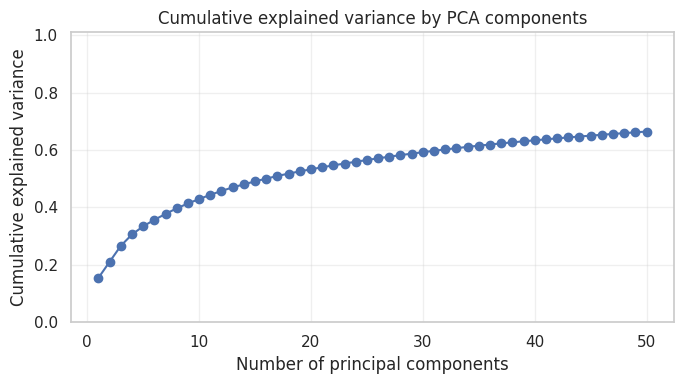

In [ ]:
N, H, W, C = X_all.shape
X_flat = X_all.reshape(N, H * W * C)
scaler = StandardScaler(with_mean=True, with_std=True)
X_flat_scaled = scaler.fit_transform(X_flat)

n_components = 50
pca = PCA(n_components=n_components, random_state=42)

X_pca = pca.fit_transform(X_flat_scaled)  # (N, n_components)

print("PCA-transformed shape:", X_pca.shape)

expl_var_ratio = pca.explained_variance_ratio_
cum_expl_var = np.cumsum(expl_var_ratio)

# Plot cumulative explained variance
plt.figure(figsize=(7,4))
plt.plot(range(1, n_components + 1), cum_expl_var, marker="o")
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.ylim(0, 1.01)
plt.grid(alpha=0.3)
plt.title("Cumulative explained variance by PCA components")
plt.tight_layout()
plt.show()

The curve rises quickly at first, meaning the first 10–15 components already capture a meaningful amount of structure, but after that the gains become gradual and never form a sharp elbow. By the time we reach 50 components, PCA explains around two-thirds of the variance.

After projecting the images into a 50-dimensional PCA space, I use K-means to see whether the dataset naturally separates into meaningful groups. I try different values of k (from 3 to 10) and evaluate each model using two standard metrics: inertia, which measures how compact the clusters are, and the silhouette score, which measures how well-separated the clusters are.

k=3: inertia=44812212.00, silhouette=0.0811
k=4: inertia=42927272.00, silhouette=0.0801
k=5: inertia=41538244.00, silhouette=0.0814
k=6: inertia=40681920.00, silhouette=0.0718
k=7: inertia=39965232.00, silhouette=0.0541
k=8: inertia=39372056.00, silhouette=0.0510
k=9: inertia=38884256.00, silhouette=0.0492
k=10: inertia=38327320.00, silhouette=0.0524


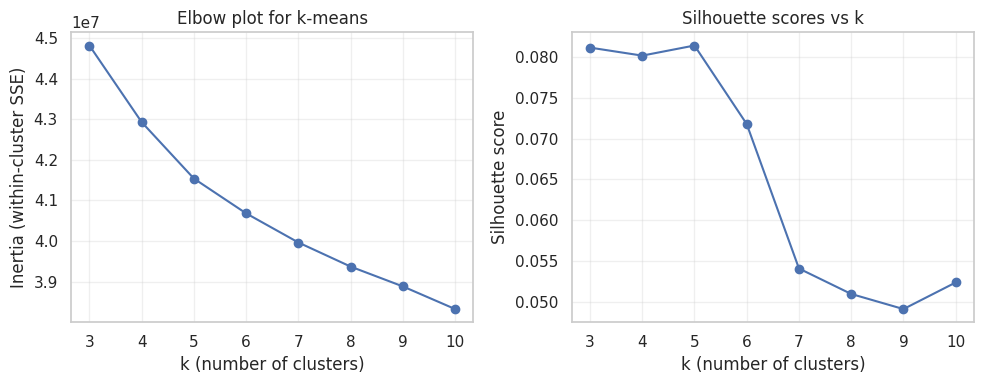

Chosen number of clusters (best_k): 5


In [ ]:
k_values = list(range(3, 11))  # try k = 3,...,10
inertias = []
sil_scores = []

for k in k_values:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans_tmp.fit_predict(X_pca)

    inertias.append(kmeans_tmp.inertia_)

    # Silhouette requires at least 2 clusters and < N clusters
    sil = silhouette_score(X_pca, cluster_labels)
    sil_scores.append(sil)
    print(f"k={k}: inertia={kmeans_tmp.inertia_:.2f}, silhouette={sil:.4f}")

# Plot inertia (elbow) and silhouette score
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].plot(k_values, inertias, marker="o")
ax[0].set_xlabel("k (number of clusters)")
ax[0].set_ylabel("Inertia (within-cluster SSE)")
ax[0].set_title("Elbow plot for k-means")
ax[0].grid(alpha=0.3)

ax[1].plot(k_values, sil_scores, marker="o")
ax[1].set_xlabel("k (number of clusters)")
ax[1].set_ylabel("Silhouette score")
ax[1].set_title("Silhouette scores vs k")
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Automatically pick k with highest silhouette score
best_k = k_values[int(np.argmax(sil_scores))]
print("Chosen number of clusters (best_k):", best_k)

The elbow plot shows the drop in inertia as k increases, the curve gradually slopes downward which means that the dataset doesn’t have strong, well-separated groups for K-means to latch onto. The silhouette plot shows that the scores are low across the board, and they peak only at k = 5. Thus, the conclusion is that PCA shows that most variation in the images is smooth and continuous (brightness, angle, composition), not separated into categories. K-means shows no strong cluster boundaries (low silhouette scores, no elbow), meaning the dataset doesn't naturally break into discrete groups.

Now, I apply k-means clustering to the PCA-reduced embeddings to see whether the images form any meaningful groups in this low-dimensional space. I use the best-k value chosen from the silhouette analysis and then visualize how those clusters distribute across the first two principal components to check whether they form clear, separable structures.

In [ ]:
# Fit final k-means model with best_k

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_pca)

print("Cluster label counts:", np.bincount(cluster_labels))

Cluster label counts: [276 391 375 360 305]


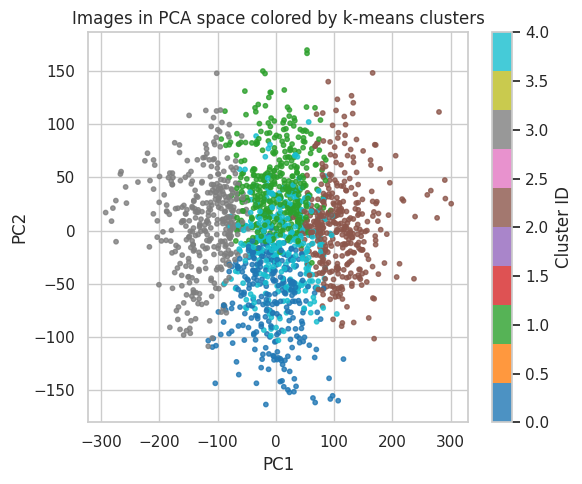

In [ ]:
# Visualize PCA space with clusters

plt.figure(figsize=(6,5))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=cluster_labels, cmap="tab10", s=10, alpha=0.8
)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Images in PCA space colored by k-means clusters")
plt.colorbar(scatter, label="Cluster ID")
plt.tight_layout()
plt.show()

The PCA scatter plot with cluster labels shows that the clusters heavily overlap and do not form distinct, isolated regions. Even though k-means technically assigns each image to a cluster, the boundaries between groups are messy. Thus, the dataset does not have strong natural divisions.

To understand what each k-means cluster actually represents, I display a few raw images from each group.

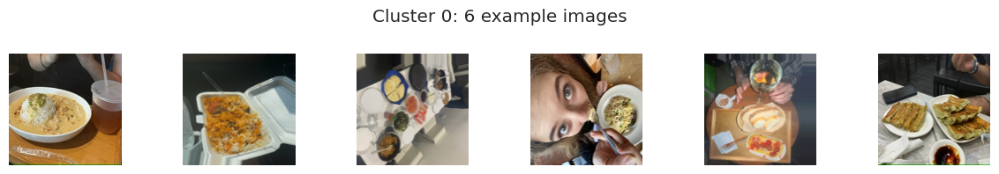

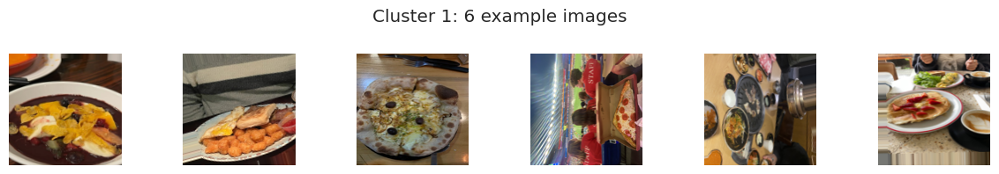

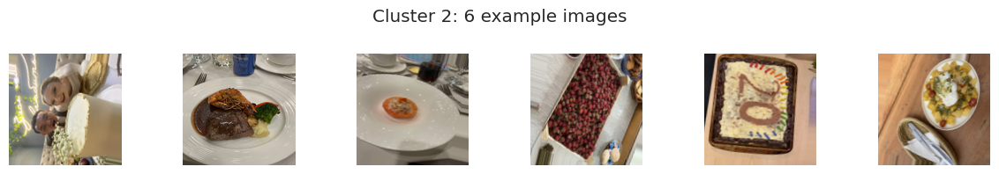

In [ ]:
def show_cluster_examples(cluster_id, n_examples=8):
    """
    Show a few example images from a given cluster.
    cluster_id: integer in [0, best_k-1]
    """
    idx = np.where(cluster_labels == cluster_id)[0]
    if len(idx) == 0:
        print(f"No images in cluster {cluster_id}")
        return

    # pick up to n_examples indices
    n_show = min(n_examples, len(idx))
    chosen = np.random.choice(idx, size=n_show, replace=False)

    plt.figure(figsize=(2*n_show, 2))
    for i, img_idx in enumerate(chosen):
        plt.subplot(1, n_show, i + 1)
        plt.imshow(X_all[img_idx])  # X_all is in [0,1]
        plt.axis("off")
    plt.suptitle(f"Cluster {cluster_id}: {n_show} example images")
    plt.tight_layout()
    plt.show()

# visualize first 3 clusters
for cid in range(min(best_k, 3)):
    show_cluster_examples(cid, n_examples=6)

Although the clusters are not clean or perfectly coherent, there are some weak patterns that explain why k-means grouped these images together. Cluster 0 tends to include close-up, warm-toned shots of food taken indoors, with mixed dishes or busy table settings. Cluster 1 seems to capture brighter, more colorful scenes, including pizzas and meals in more vibrant environments, sometimes with people or backgrounds visible. Cluster 2 contains images with more neutral lighting and “formal”-looking meals, such as plated meals or desserts in restaurants or at events. These patterns are subtle and not strong enough to form clearly separated groups, which is why the clusters still feel mixed.

## Convolutional Autoencoder (CAE)

After exploring the structure of my dataset with PCA and k-means, I found that the images do not separate cleanly into distinct groups. Instead of forcing clusters, the next step is to use a Convolutional Autoencoder (CAE), which learns a compact latent representation of each image without assuming any predefined categories. A CAE is good for this dataset because it can capture subtle continuous patterns in lighting, color, and composition that linear methods like PCA cannot fully model. Thus, I can evaluate how well a nonlinear model compresses the visual information and whether the latent space organizes the dataset in a more meaningful way than PCA or clustering did.

In [ ]:
input_shape = X_all.shape[1:]   # (H, W, C)
latent_dim = 64                 # size of bottleneck representation

I split the dataset of images into two parts: 80% for training and 20% for validation.

In [ ]:
# Train / validation split
X_train, X_val = train_test_split(
    X_all,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

print("Train shape:", X_train.shape)
print("Val shape:", X_val.shape)

Train shape: (1365, 128, 128, 3)
Val shape: (342, 128, 128, 3)


The encoder starts with an input image

$$x \in \mathbb{R}^{128 \times 128 \times 3}$$

and applies a sequence of convolutional layers. Each convolution computes

$$
h^{(l)} = \sigma\!\left( h^{(l-1)} * W^{(l)} + b^{(l)} \right)
$$

where
* `*` is the convolutional operator
* W are learnable convolution kernels
* b is a bias term
* σ is the ReLU activation.

With stride 2, the spatial resolution halves at each layer:

$$
128 \rightarrow 64 \rightarrow 32 \rightarrow 16 \rightarrow 8.
$$

Meanwhile the channels expand:

$$
3 \rightarrow 32 \rightarrow 64 \rightarrow 64 \rightarrow 128.
$$

So the final convolution output before flattening is:

$$
h^{(4)} \in \mathbb{R}^{8 \times 8 \times 128}.
$$


Flattening gives a vector:
$$
8 \cdot 8 \cdot 128 = 8192.
$$

The latent vector is produced by a linear projection:
$$
z = W_{\text{lat}}\, h^{\text{flat}} + b_{\text{lat}},
\qquad z \in \mathbb{R}^{64}.
$$

This is a learned compression map:
$$
f_{\theta} : \mathbb{R}^{49152} \rightarrow \mathbb{R}^{64}.
$$

Now, let's see what's happening with the decoder.

The decoder tries to reconstruct the original image:

$$
\hat{x} = g_{\phi}(z).
$$

First, it expands the latent vector back:

$$
h^{\text{flat}}_{\text{dec}} = W_{\text{dec}}\, z + b_{\text{dec}},
\qquad h^{\text{flat}}_{\text{dec}} \in \mathbb{R}^{8192}.
$$

Then reshapes to match the encoder’s last activation:
$$
h^{(0)}_{\text{dec}} \in \mathbb{R}^{8 \times 8 \times 128}.
$$

Next, a sequence of transposed convolutions is applied. Each layer performs:

$$
h^{(l+1)}_{\text{dec}} =
\sigma\!\left( \text{ConvTranspose}\left(h^{(l)}_{\text{dec}}, W^{(l)}\right)
+ b^{(l)} \right).
$$

Each layer doubles the spatial size:
$$
8 \rightarrow 16 \rightarrow 32 \rightarrow 64 \rightarrow 128.
$$

The final layer applies a sigmoid:
$$
\hat{x} = \sigma\!\left( h^{(\text{last})} \right),
\qquad \hat{x} \in [0,1].
$$

We also need to find the MSE loss as the training minimizes the reconstruction error:
$$
\mathcal{L}(\theta, \phi)
= \mathbb{E}\Big[ \Vert x - g_{\phi}( f_{\theta}(x) ) \Vert_2^2 \Big].
$$

This makes the encoder learn a low-dimensional representation that keeps the key visual structure of the image.

The full encoder-decoder mapping then is:
$$
\hat{x} = g_{\phi}(f_{\theta}(x)).
$$

Essentially, the convolutional autoencoder learns how to compress each 128×128 food image into a tiny 64-dimensional vector by repeatedly shrinking the spatial resolution and keeping only the most essential visual patterns, then uses the decoder to expand that compact code back into an image by reversing the same steps. Conceptually, the encoder extracts “textures, colors, shapes, and the decoder tries to rebuild the original picture from that compressed representation.

In [ ]:
def build_cae(input_shape, latent_dim=64):
    # Encoder
    encoder_inputs = layers.Input(shape=input_shape, name="encoder_input")

    x = layers.Conv2D(32, kernel_size=3, strides=1, padding="same", activation="relu")(encoder_inputs)
    x = layers.Conv2D(32, kernel_size=3, strides=2, padding="same", activation="relu")(x)  # H/2, W/2
    x = layers.Conv2D(64, kernel_size=3, strides=2, padding="same", activation="relu")(x)  # H/4, W/4
    x = layers.Conv2D(128, kernel_size=3, strides=2, padding="same", activation="relu")(x) # H/8, W/8

    shape_before_flatten = K.int_shape(x)[1:]  # (H_enc, W_enc, C_enc)

    x = layers.Flatten()(x)
    latent = layers.Dense(latent_dim, name="latent")(x)

    encoder = models.Model(encoder_inputs, latent, name="encoder")

    # Decoder
    decoder_inputs = layers.Input(shape=(latent_dim,), name="decoder_input")

    x = layers.Dense(np.prod(shape_before_flatten))(decoder_inputs)
    x = layers.Reshape(target_shape=shape_before_flatten)(x)

    x = layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same", activation="relu")(x) # 2x
    x = layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding="same", activation="relu")(x)  # 4x
    x = layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="same", activation="relu")(x)  # 8x

    decoder_outputs = layers.Conv2D(
        filters=input_shape[-1],
        kernel_size=3,
        strides=1,
        padding="same",
        activation="sigmoid",   # output in [0,1]
        name="decoder_output"
    )(x)

    decoder = models.Model(decoder_inputs, decoder_outputs, name="decoder")

    # Full autoencoder
    autoencoder_outputs = decoder(encoder(encoder_inputs))
    autoencoder = models.Model(encoder_inputs, autoencoder_outputs, name="autoencoder")

    return encoder, decoder, autoencoder

encoder, decoder, autoencoder = build_cae(input_shape, latent_dim)

autoencoder.summary()

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder (Functional)            │ (None, 64)             │     2,199,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 128, 128, 3)    │     2,370,627 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,570,339 (17.43 MB)

 Trainable params: 4,570,339 (17.43 MB)

 Non-trainable params: 0 (0.00 B)

The model summary tells us that the encoder successfully transforms a full 128×128×3 image into a 64-dimensional latent vector, meaning the network compresses every image into a tiny numerical fingerprint. Then it shows that the decoder takes that 64-dimensional vector and reconstructs a 128×128×3 image again, which confirms that the model is structurally correct and the layers match perfectly.

First, the model is compiled with the Adam optimizer and mean squared error (MSE) as the loss function, which measures how close the reconstructed images are to the original ones. Then, during training, I apply two callbacks: EarlyStopping, which stops the training if the validation loss stops improving for several epochs, and ModelCheckpoint, which saves the best version of the model based on validation performance. The training loop runs the autoencoder for up to 15 epochs, feeding the model the training images.

In [ ]:
# Compile CAE
autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="mse",
    metrics=["mse"]
)

In [ ]:
# Train CAE
checkpoint_path = "best_cae_weights.weights.h5"

callbacks = [
    EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True
    ),
    ModelCheckpoint(
        filepath=checkpoint_path,
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True
    )
]

history_cae = autoencoder.fit(
    X_train, X_train,
    epochs=15,
    batch_size=32,
    shuffle=True,
    validation_data=(X_val, X_val),
    callbacks=callbacks,
    verbose=1
)

Epoch 1/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - loss: 0.0637 - mse: 0.0637 - val_loss: 0.0525 - val_mse: 0.0525
Epoch 2/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0351 - val_mse: 0.0351
Epoch 3/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0304 - val_mse: 0.0304
Epoch 4/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - loss: 0.0293 - mse: 0.0293 - val_loss: 0.0272 - val_mse: 0.0272
Epoch 5/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 145s 3s/step - loss: 0.0266 - mse: 0.0266 - val_loss: 0.0253 - val_mse: 0.0253
Epoch 6/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 122s 3s/step - loss: 0.0243 - mse: 0.0243 - val_loss: 0.0240 - val_mse: 0.0240
Epoch 7/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - loss: 0.0225 - mse: 0.0225 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 8/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - loss: 0.0205 - mse: 0.0205 - val_loss: 0.0215 - val_mse: 0.0215
Epoch 9/15
43/43 ━━━━━━━━━━━━━━━━━━━━ 132s 3s/step - loss: 0.019

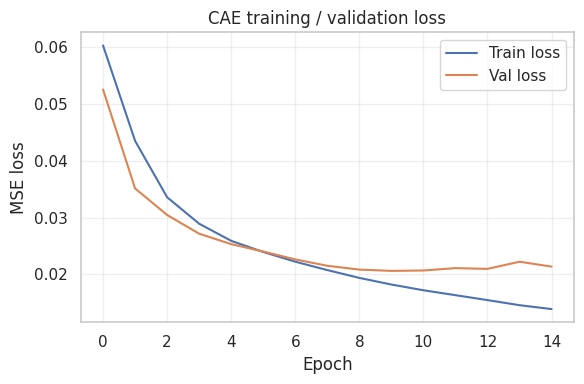

In [ ]:
# Plot training & validation loss for CAE
plt.figure(figsize=(6,4))
plt.plot(history_cae.history["loss"], label="Train loss")
plt.plot(history_cae.history["val_loss"], label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("MSE loss")
plt.title("CAE training / validation loss")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

This plot shows how the CAE’s reconstruction error changes over the 15 training epochs for both the training and validation sets. Both curves drop sharply at the beginning, which means the model quickly learns the basic structure of the images and becomes better at reconstructing them. The gap between the curves is small, so there is only a bit of overfitting.

The trained encoder is used to compress the training and validation images into their 64-dimensional latent codes, so the model turns each full image into a small numerical version that represent the most important visual features.

In [ ]:
# Use encoder to get latent codes
Z_cae_train = encoder.predict(X_train, batch_size=64)
Z_cae_val   = encoder.predict(X_val, batch_size=64)

print("Z_cae_train shape:", Z_cae_train.shape)
print("Z_cae_val shape:", Z_cae_val.shape)

22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 338ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 517ms/step
Z_cae_train shape: (1365, 64)
Z_cae_val shape: (342, 64)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


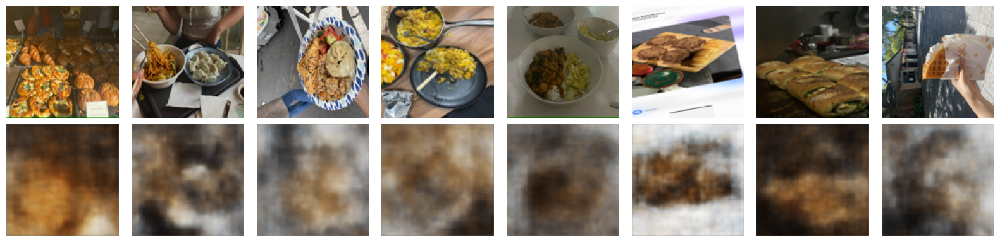

In [ ]:
# Visualize CAE reconstructions
def show_reconstructions(model, data, n_images=8):
    """
    Show original and reconstructed images for a trained autoencoder.
    model: autoencoder
    data:  array of images in [0,1]
    """
    idx = np.random.choice(len(data), size=n_images, replace=False)
    originals = data[idx]
    recons = model.predict(originals)

    plt.figure(figsize=(2*n_images, 4))
    for i in range(n_images):
        # original
        plt.subplot(2, n_images, i + 1)
        plt.imshow(originals[i])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        # reconstruction
        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[i])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Reconstructed")
    plt.tight_layout()
    plt.show()

show_reconstructions(autoencoder, X_val, n_images=8)

The output shows the images from the validation set (top row) and their corresponding reconstructions (bottom row). While the model manages to capture very rough global structure, it fails o reproduce any meaningful detail, texture, or recognizable objects. Eventually, we have blurry color blobs which means that the autoencoder could not learn a strong or stable compressed representation of the images.

After visualizing the reconstructions, the next step is to quantify how well the CAE performs using reconstruction error. For each image in the validation set, I compute the mean squared error (MSE) between the original and reconstructed versions to measure how much information the autoencoder loses during compression.

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 531ms/step
Reconstruction error stats (val set):
 min: 0.004498021
 max: 0.039960522
 mean: 0.020609584


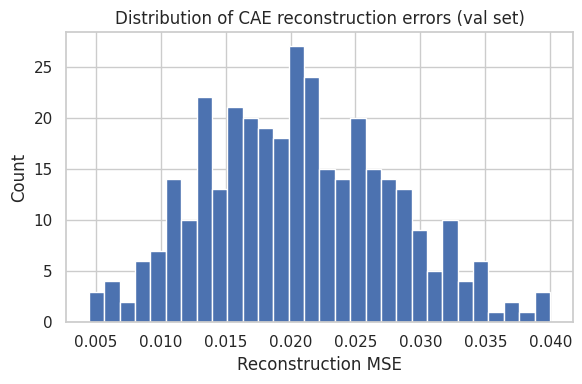

In [ ]:
# Compute per-image reconstruction error
recons_val = autoencoder.predict(X_val)
recon_errors_val = np.mean((X_val - recons_val) ** 2, axis=(1, 2, 3))

print("Reconstruction error stats (val set):")
print(" min:", recon_errors_val.min())
print(" max:", recon_errors_val.max())
print(" mean:", recon_errors_val.mean())

plt.figure(figsize=(6,4))
plt.hist(recon_errors_val, bins=30)
plt.xlabel("Reconstruction MSE")
plt.ylabel("Count")
plt.title("Distribution of CAE reconstruction errors (val set)")
plt.tight_layout()
plt.show()

The histogram shows that most reconstruction errors fall between roughly 0.01 and 0.03, with a mean around 0.020, so the CAE’s reconstructions are blurry and lack detail. The model struggles equally across the entire dataset rather than failing only on specific types of images.

Now, , I compute the reconstruction error for every image in both the training and validation sets. If model has learned meaningful representations, then its reconstructed images should be close to the originals, and the per-image Mean Squared Error (MSE) will be low.

22/22 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 961ms/step
Train reconstruction MSE:
  mean: 0.016803268
  median: 0.016356526
  10th–90th percentile: 0.009743212 0.024641814

Validation reconstruction MSE:
  mean: 0.020609584
  median: 0.020232927
  10th–90th percentile: 0.011254521 0.02988374


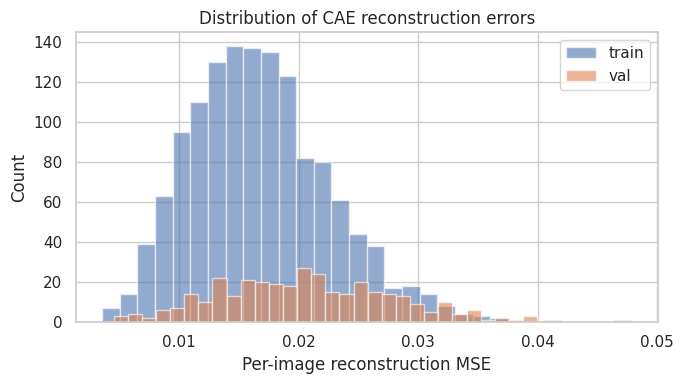

In [ ]:
# Compute reconstruction errors on train & val
recons_train = autoencoder.predict(X_train, batch_size=64)
recons_val   = autoencoder.predict(X_val,   batch_size=64)

# MSE per image
mse_train = np.mean((X_train - recons_train) ** 2, axis=(1,2,3))
mse_val   = np.mean((X_val   - recons_val)   ** 2, axis=(1,2,3))

print("Train reconstruction MSE:")
print("  mean:", mse_train.mean())
print("  median:", np.median(mse_train))
print("  10th–90th percentile:",
      np.percentile(mse_train, 10),
      np.percentile(mse_train, 90))

print("\nValidation reconstruction MSE:")
print("  mean:", mse_val.mean())
print("  median:", np.median(mse_val))
print("  10th–90th percentile:",
      np.percentile(mse_val, 10),
      np.percentile(mse_val, 90))

# Histograms for comparison
plt.figure(figsize=(7,4))
plt.hist(mse_train, bins=30, alpha=0.6, label="train")
plt.hist(mse_val,   bins=30, alpha=0.6, label="val")
plt.xlabel("Per-image reconstruction MSE")
plt.ylabel("Count")
plt.title("Distribution of CAE reconstruction errors")
plt.legend()
plt.tight_layout()
plt.show()

The results show that the autoencoder achieves consistently low reconstruction errors for both the training and validation sets, with the training distribution centered slightly lower, as expected. The validation errors are only marginally higher, and the two histograms overlap substantially, which indicates that the model generalizes reasonably well and is not heavily overfitting. Overall, the reconstruction-error distribution confirms that the CAE learned a stable, coherent representation of the dataset.

I also want to look at specific images the model handles especially well or especially poorly. To do this, I sort all validation images by their per-image reconstruction MSE and visualize pairs of original and reconstructed images at both extremes. This gives a more intuitive sense of the model’s strengths and weaknesses.

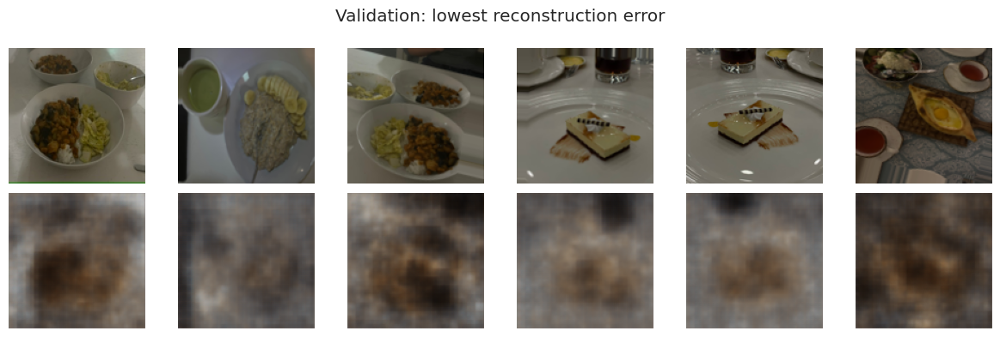

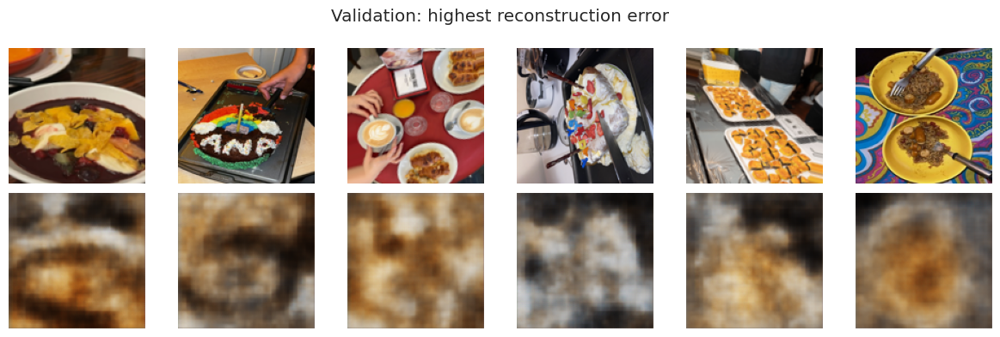

In [ ]:
def show_best_and_worst(data, recons, mse, n_images=5, title_prefix="Val"):
    """Show originals and reconstructions for lowest- and highest-error images."""
    sorted_idx = np.argsort(mse)
    best_idx   = sorted_idx[:n_images]
    worst_idx  = sorted_idx[-n_images:]

    # Lowest-error examples
    plt.figure(figsize=(2*n_images, 4))
    for i, idx in enumerate(best_idx):
        plt.subplot(2, n_images, i + 1)
        plt.imshow(data[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Recon")
    plt.suptitle(f"{title_prefix}: lowest reconstruction error")
    plt.tight_layout()
    plt.show()

    # Highest-error examples
    plt.figure(figsize=(2*n_images, 4))
    for i, idx in enumerate(worst_idx):
        plt.subplot(2, n_images, i + 1)
        plt.imshow(data[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Recon")
    plt.suptitle(f"{title_prefix}: highest reconstruction error")
    plt.tight_layout()
    plt.show()

# Visualize best and worst CAE reconstructions on validation set
show_best_and_worst(X_val, recons_val, mse_val, n_images=6, title_prefix="Validation")

The lowest-error images seem to share a pretty clear pattern. They’re visually simple, with fairly uniform colors and fewer distinct objects. When I looked at them side by side, it made sense that the CAE can reconstruct these well, because there isn’t much fine detail for the model to compress. In contrast, the highest-error images immediately look more chaotic. They include multiple items, strong textures, complex backgrounds, and sharp color transitions. These characteristics demand much richer spatial representation, and with a small latent bottleneck the CAE just can’t retain that level of detail. That’s why the reconstructions in these difficult cases blur into vague color blobs rather than preserving structure. Seeing the examples laid out like this actually helps explain the error distribution from earlier: the model handles calm, low-detail scenes reasonably well but breaks down on visually busy or compositionally complex images. It’s a nice confirmation that the architecture, not just random noise, is driving the performance patterns.

## Variational Autoencoder (VAE)

After training the convolutional autoencoder, it became pretty obvious that the model compresses the images, but the reconstructions are still blurry and the latent space doesn’t behave especially well. A regular CAE learns a single deterministic bottleneck vector, which means it has no built-in structure for how images should be organized in latent space. So, I decided to see how the Variational Autoencoder will work in this case and analyze its performance. A Variational Autoencoder (VAE) fixes that by adding probabilistic structure to the bottleneck. Instead of producing a single point, the encoder outputs a distribution for each dimension of the latent vector. Thus, it should perform better.

In [ ]:
vae_input_shape = X_all.shape[1:]   # (H, W, C)
vae_latent_dim = 16                 # latent space size

Before training the VAE, I split the dataset into training and validation sets.

In [ ]:
# Train / validation split for VAE
X_train_vae, X_val_vae = train_test_split(
    X_all,
    test_size=0.2,
    random_state=123,
    shuffle=True
)
print("VAE Train shape:", X_train_vae.shape)
print("VAE Val shape:", X_val_vae.shape)

VAE Train shape: (1365, 128, 128, 3)
VAE Val shape: (342, 128, 128, 3)


The encoder starts with some convolutional layers that reduce the spatial resolution of a 128×128×3 image while increasing the number of feature maps. It is the same process as wuth the standard convultional encoder. Then, the encoder splits into two dense layers. One layer is for producing the latent mean vector μ and another is for producing the log-variance vector.

$$
z_{\text{mean}} = \mu(x)
$$

$$
z_{\text{logvar}} = \log \sigma^2(x)
$$

$$
q_\phi(z \mid x) = N (z_{\text{mean}}, \; \mathrm{diag}(\sigma^2))
$$
Basically, for every image, the model does not assign a single latent code but a full distribution describing possible latent representations.


We need to use reparameterization because directly sampling would break backpropagation.
$$
z = z_{\text{mean}} + \sigma \odot \epsilon
$$

$$
\epsilon ∼ N(0, I)
$$

Thus, the layer performs

$$
z = z_{\text{mean}} + \exp\left(0.5 \cdot z_{\text{logvar}}\right) \cdot \epsilon
$$

to keep he entire computation differentiable (for the gradient).

In [ ]:
class Sampling(layers.Layer):
    """
    Uses (z_mean, z_log_var) to sample z = mean + exp(0.5 * log_var) * epsilon
    """

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim   = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

After sampling a latent vector z, the decoder basically tries to reverse everything the encoder did, but in the opposite direction. First, a dense layer expands the low-dimensional vector back into a tensor with the same shape as the encoder had right before flattening. Then this tensor is reshaped so it becomes a small spatial feature map again. After that, several transposed convolution layers gradually upsample the representation until it reaches the original 128×128×3 resolution of the input images. The final layer applies a sigmoid activation, ensuring that the reconstructed pixels stay in the valid range [0,1], which can be written as:

$$
\hat{x} = \sigma(\text{ConvTranspose}(\dots(z))).
$$

Overall, the decoder is learning the conditional distribution of images given a latent code,

$$
p_\theta(x \mid z),
$$

which means that it is trying to map points in the latent space back into realistic images that resemble those in the dataset.

In [ ]:
# Build VAE encoder & decoder
def build_vae_encoder(input_shape, latent_dim):
    encoder_inputs = layers.Input(shape=input_shape, name="encoder_input")

    x = layers.Conv2D(32, 3, strides=1, padding="same", activation="relu")(encoder_inputs)
    x = layers.Conv2D(32, 3, strides=2, padding="same", activation="relu")(x)  # H/2
    x = layers.Conv2D(64, 3, strides=2, padding="same", activation="relu")(x)  # H/4
    x = layers.Conv2D(128, 3, strides=2, padding="same", activation="relu")(x) # H/8

    shape_before_flatten = K.int_shape(x)[1:]  # (H_enc, W_enc, C_enc)

    x = layers.Flatten()(x)

    z_mean    = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z         = Sampling()([z_mean, z_log_var])

    encoder = models.Model(
        encoder_inputs, [z_mean, z_log_var, z],
        name="vae_encoder"
    )

    return encoder, shape_before_flatten


def build_vae_decoder(latent_dim, shape_before_flatten, output_channels):
    decoder_inputs = layers.Input(shape=(latent_dim,), name="z_sampling")

    x = layers.Dense(np.prod(shape_before_flatten), activation="relu")(decoder_inputs)
    x = layers.Reshape(target_shape=shape_before_flatten)(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same", activation="relu")(x)  # 2x
    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)   # 4x
    x = layers.Conv2DTranspose(32, 3, strides=2, padding="same", activation="relu")(x)   # 8x

    decoder_outputs = layers.Conv2D(
        filters=output_channels,
        kernel_size=3,
        strides=1,
        padding="same",
        activation="sigmoid",
        name="decoder_output"
    )(x)

    decoder = models.Model(decoder_inputs, decoder_outputs, name="vae_decoder")
    return decoder

When training a VAE, the model optimizes loss that balances two goals: accurate reconstruction and a well-behaved latent space. The first part is the reconstruction loss, which measures how different the reconstructed image is from the original. This is just the squared error

$$
L_{\text{recon}} = \lVert x - \hat{x} \rVert^2,
$$

The second part is the KL divergence, which acts as a regularizer on the latent distribution. Instead of letting the encoder produce any random set of means and variances, the KL term pushes the learned distribution toward a standard normal.

$$
L_{\text{KL}} = -\frac{1}{2} \sum_{i=1}^{d} \left( 1 + z_{\text{logvar},i} - z_{\text{mean},i}^2 - \exp(z_{\text{logvar},i}) \right),
$$

This controls that the latent space stays smooth and continuous and doesn't collapse to a few points. The total VAE loss:

$$
L_{\text{VAE}} = L_{\text{recon}} + L_{\text{KL}},
$$
So, the model learns to reconstruct images while keeping the latent space organized in a way that supports interpolation, sampling, and generating new variations of the data.

In [ ]:
# Define VAE model class
class VAE(models.Model):
    def __init__(self, encoder, decoder, beta=1.0, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.beta = beta
        self.total_loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]

        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)

            # Reconstruction loss (MSE summed over pixels, averaged over batch)
            recon_loss = tf.reduce_mean(
                tf.reduce_sum(tf.square(data - reconstruction), axis=(1, 2, 3))
            )

            # KL divergence between q(z|x) and N(0,I)
            kl_loss = -0.5 * tf.reduce_mean(
                tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            )

            total_loss = recon_loss + self.beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(recon_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def test_step(self, data):
        if isinstance(data, tuple):
            data = data[0]

        z_mean, z_log_var, z = self.encoder(data)
        reconstruction = self.decoder(z)

        recon_loss = tf.reduce_mean(
            tf.reduce_sum(tf.square(data - reconstruction), axis=(1, 2, 3))
        )
        kl_loss = -0.5 * tf.reduce_mean(
            tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
        )
        total_loss = recon_loss + self.beta * kl_loss

        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(recon_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }


In [ ]:
# Build encoder, decoder, and VAE
vae_encoder, enc_shape = build_vae_encoder(vae_input_shape, vae_latent_dim)
vae_decoder = build_vae_decoder(vae_latent_dim, enc_shape, output_channels=vae_input_shape[-1])

# You can pass a custom beta value here, e.g., beta=0.001
vae = VAE(vae_encoder, vae_decoder, beta=1.0, name="food_vae")

vae_encoder.summary()
vae_decoder.summary()

Model: "vae_encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ encoder_input       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │        896 │ encoder_input[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_4[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │     18,496 │ conv2d_5[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │     73,856 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 32768)     │          0 │ conv2d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 16)        │    524,304 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 16)        │    524,304 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling (Sampling) │ (None, 16)        │          0 │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,151,104 (4.39 MB)

 Trainable params: 1,151,104 (4.39 MB)

 Non-trainable params: 0 (0.00 B)

Model: "vae_decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ z_sampling (InputLayer)         │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32768)          │       557,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 32, 32, 128)    │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 64, 64, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 128, 128, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_output (Conv2D)         │ (None, 128, 128, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 797,763 (3.04 MB)

 Trainable params: 797,763 (3.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile VAE
vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3))

Intuitively, a VAE is basically an autoencoder that forces itself to learn meaningful latent representations instead of just memorizing how to reconstruct images. The encoder doesn’t just spit out one latent vector but instead predicts a distribution (a mean and a log-variance), and then the model samples a point from that distribution using the reparameterization. This makes the latent space continuous and structured, so nearby points produce similar images. The decoder then tries to rebuild the original picture from that sampled vector.

In [ ]:
# Train VAE
vae_checkpoint_path = "best_vae_weights.weights.h5"

vae_callbacks = [
    EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True
    ),
    ModelCheckpoint(
        filepath=vae_checkpoint_path,
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True
    )
]

# Build the VAE model before training
vae.build(vae_input_shape)

history_vae = vae.fit(
    X_train_vae,
    X_train_vae,
    epochs=10,
    batch_size=32,
    shuffle=True,
    validation_data=(X_val_vae, X_val_vae),
    callbacks=vae_callbacks,
    verbose=1
)

Epoch 1/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - kl_loss: 4.9097 - loss: 3098.1316 - reconstruction_loss: 3093.2214 - val_kl_loss: 7.5204 - val_loss: 2625.9561 - val_reconstruction_loss: 2618.4353
Epoch 2/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - kl_loss: 18.5709 - loss: 2516.7786 - reconstruction_loss: 2498.2075 - val_kl_loss: 21.5221 - val_loss: 2109.5696 - val_reconstruction_loss: 2088.0474
Epoch 3/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - kl_loss: 29.5634 - loss: 2089.9111 - reconstruction_loss: 2060.3477 - val_kl_loss: 34.6970 - val_loss: 1846.5933 - val_reconstruction_loss: 1811.8964
Epoch 4/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - kl_loss: 34.9329 - loss: 1800.0035 - reconstruction_loss: 1765.0706 - val_kl_loss: 39.7492 - val_loss: 1717.1190 - val_reconstruction_loss: 1677.3696
Epoch 5/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - kl_loss: 38.2785 - loss: 1687.3411 - reconstruction_loss: 1649.0625 - val_kl_loss: 43.2937 - val_loss: 1551.7661 - val_reconstruction_loss

To understand how well the VAE actually learns, I need to look at how its different loss components behave during training. Unlike the CAE, the VAE has two losses happening at the same time: a reconstruction loss that measures how accurately the model rebuilds an image, and a KL divergence term that regularizes the latent space to follow a normal distribution.

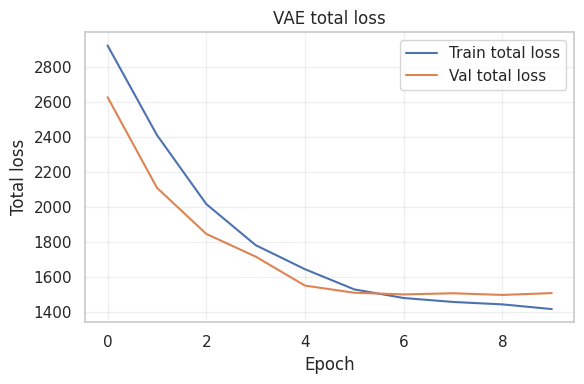

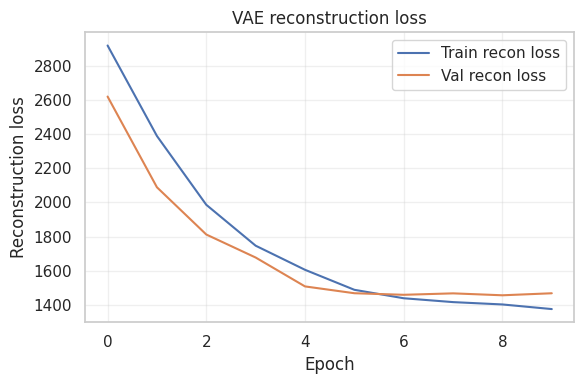

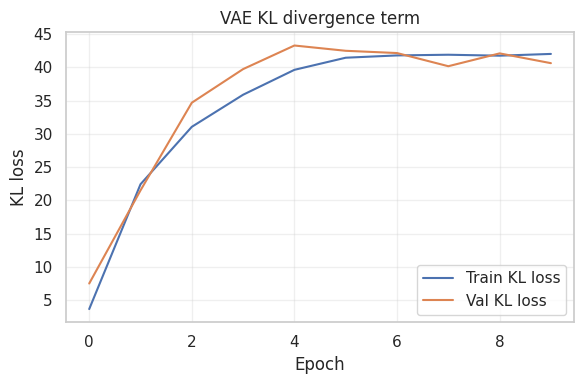

In [ ]:
# Plot VAE training curves
plt.figure(figsize=(6,4))
plt.plot(history_vae.history["loss"], label="Train total loss")
plt.plot(history_vae.history["val_loss"], label="Val total loss")
plt.xlabel("Epoch")
plt.ylabel("Total loss")
plt.title("VAE total loss")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.plot(history_vae.history["reconstruction_loss"], label="Train recon loss")
plt.plot(history_vae.history["val_reconstruction_loss"], label="Val recon loss")
plt.xlabel("Epoch")
plt.ylabel("Reconstruction loss")
plt.title("VAE reconstruction loss")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.plot(history_vae.history["kl_loss"], label="Train KL loss")
plt.plot(history_vae.history["val_kl_loss"], label="Val KL loss")
plt.xlabel("Epoch")
plt.ylabel("KL loss")
plt.title("VAE KL divergence term")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The **total loss** decreases for both train and validation sets, which means the model is consistently improving at the combined task of reconstructing images while keeping the latent space organized. The training and validation curves stay close to each other and never diverge in opposite directions, suggesting that the model is not overfitting and is generalizing reasonably well. Around epoch 5, both curves start to flatten, showing that the VAE reaches a stable optimization point relatively quickly.

The **reconstruction-only loss** shows a similar downward pattern. The model  produces reconstructions that are less blurry and more faithful to the input images. Interestingly, the validation reconstruction loss is slightly lower than the training loss across the first half of training. This usually means that the validation images are a bit easier to reconstruct.

The **KL divergence** term increases during the first few epochs and then stabilizes around a fixed range. Instead of collapsing the latent space into a single point (a known VAE failure), the model is gradually learning a smooth, normally-distributed latent structure. A rising KL term is expected because the model is being pushed to encode meaningful variation.

Before evaluating whether the VAE learned anything meaningful, I extract the latent representations for the validation images and visualize a set of reconstructions.

In [ ]:
# Get latent codes (use z_mean as embedding)
z_mean_train, z_log_var_train, z_train = vae_encoder.predict(X_train_vae, batch_size=64)
z_mean_val,   z_log_var_val,   z_val   = vae_encoder.predict(X_val_vae,   batch_size=64)

print("z_mean_train shape:", z_mean_train.shape)
print("z_mean_val shape:", z_mean_val.shape)

22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 352ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 290ms/step
z_mean_train shape: (1365, 16)
z_mean_val shape: (342, 16)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


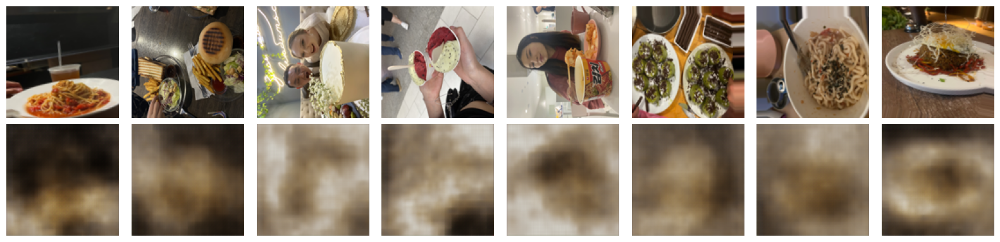

In [ ]:
# Visualize VAE reconstructions
def show_vae_reconstructions(vae_model, data, n_images=8):
    idx = np.random.choice(len(data), size=n_images, replace=False)
    originals = data[idx]
    z_mean, z_log_var, z = vae_model.encoder.predict(originals)
    recons = vae_model.decoder.predict(z)

    plt.figure(figsize=(2*n_images, 4))
    for i in range(n_images):
        # original
        plt.subplot(2, n_images, i + 1)
        plt.imshow(originals[i])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        # reconstruction
        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[i])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Recon")
    plt.tight_layout()
    plt.show()

show_vae_reconstructions(vae, X_val_vae, n_images=8)

The VAE reconstructions make its behavior very clear. Across almost all examples, the model preserves only very rough global features. The dominant colors and the general brightness of the scene. Anything beyond that (edges, textures, small objects, faces, food structure) gets blurry. This happens because the VAE is not just compressing the image but also forcing its latent vectors to follow a smooth Gaussian distribution, which limits how much fine-grained detail the model is allowed to encode. The reconstructions still differ from one input to another, suggesting that the latent space is at least capturing high-level differences between images. However, compared to the CAE, the VAE’s outputs feel more uniformly smoothed, and many images lose their internal structure entirely. Overall, this visualization confirms that the VAE trades away reconstruction sharpness for a more regularized and continuous latent space.

After examining how the VAE reconstructs actual images, I also want to see what kinds of images it can generate purely from its latent space.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


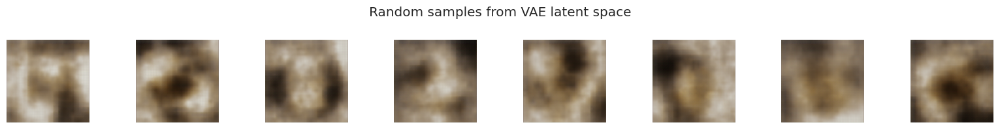

In [ ]:
# Generate new food-like images by sampling from latent prior
def generate_vae_samples(vae_model, n_samples=8):
    # sample from standard normal in latent space
    z_random = np.random.normal(size=(n_samples, vae_latent_dim)).astype("float32")
    generated = vae_model.decoder.predict(z_random)

    plt.figure(figsize=(2*n_samples, 2))
    for i in range(n_samples):
        plt.subplot(1, n_samples, i + 1)
        plt.imshow(generated[i])
        plt.axis("off")
    plt.suptitle("Random samples from VAE latent space")
    plt.tight_layout()
    plt.show()

generate_vae_samples(vae, n_samples=8)

The randomly generated samples look extremely blurry and abstract, but they still show some consistent global patterns. The colors are in the same warm palette that dominates most of my dataset, which suggests the model has learned the general color distribution of my food photos. Some samples even hint at circular or plate-like shapes, though nothing close to an actual recognizable dish. Because the VAE strongly regularizes the latent space toward a smooth Gaussian, it prioritizes continuity over detail, which means the decoder can only generate very generic texture blobs rather than sharp images. Still, the fact that the outputs aren’t pure noise shows that the VAE did internalize some statistical structure from the dataset.

To get a full picture, I computed the per-image reconstruction error for both the training and validation sets using mean squared error (MSE) between each original image and its reconstruction.

22/22 ━━━━━━━━━━━━━━━━━━━━ 8s 367ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 928ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 971ms/step
VAE train reconstruction MSE:
  mean: 0.02750533
  median: 0.02680003
  10th–90th percentile: 0.01555358 0.039721996

VAE validation reconstruction MSE:
  mean: 0.029396681
  median: 0.028754173
  10th–90th percentile: 0.01570214 0.042333066


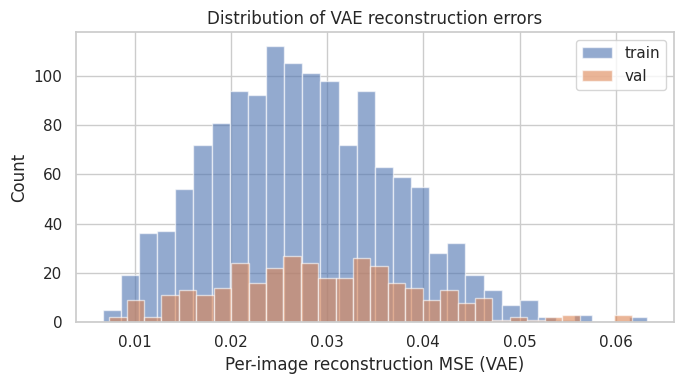

In [ ]:
# Reconstruction error distribution for VAE
sns.set(style="whitegrid")

# Encode train/val and reconstruct using z_mean as latent code
z_mean_train, z_log_var_train, z_train = vae_encoder.predict(X_train_vae, batch_size=64)
z_mean_val,   z_log_var_val,   z_val   = vae_encoder.predict(X_val_vae,   batch_size=64)

recons_train_vae = vae_decoder.predict(z_mean_train, batch_size=64)
recons_val_vae   = vae_decoder.predict(z_mean_val,   batch_size=64)

# Per-image MSE
mse_train_vae = np.mean((X_train_vae - recons_train_vae) ** 2, axis=(1,2,3))
mse_val_vae   = np.mean((X_val_vae   - recons_val_vae)   ** 2, axis=(1,2,3))

print("VAE train reconstruction MSE:")
print("  mean:", mse_train_vae.mean())
print("  median:", np.median(mse_train_vae))
print("  10th–90th percentile:",
      np.percentile(mse_train_vae, 10),
      np.percentile(mse_train_vae, 90))

print("\nVAE validation reconstruction MSE:")
print("  mean:", mse_val_vae.mean())
print("  median:", np.median(mse_val_vae))
print("  10th–90th percentile:",
      np.percentile(mse_val_vae, 10),
      np.percentile(mse_val_vae, 90))

# Histograms: train vs val
plt.figure(figsize=(7,4))
plt.hist(mse_train_vae, bins=30, alpha=0.6, label="train")
plt.hist(mse_val_vae,   bins=30, alpha=0.6, label="val")
plt.xlabel("Per-image reconstruction MSE (VAE)")
plt.ylabel("Count")
plt.title("Distribution of VAE reconstruction errors")
plt.legend()
plt.tight_layout()
plt.show()

The numeric summary already shows a few clear patterns. The mean and median MSE values for training and validation are extremely close (train mean ≈ 0.0275, val mean ≈ 0.0294). The AE is not overfitting heavily, because the reconstruction quality on unseen images is roughly the same as on the training set.

The histogram makes these observations much easier to see. Both the training and validation curves have almost identical shapes, peaking around MSE ≈ 0.02–0.03. This peak represents the “typical” images the VAE handles well. I also noticed that the validation distribution is just slightly shifted to the right compared to the training distribution. Validation images are new, so the model is naturally a bit worse at reconstructing them. Still, the difference is small enough that it reinforces the idea that the model generalizes decently without major overfitting.

To understand how well the VAE handles different kinds of images, I sort the validation set by reconstruction error and look at the best and worst cases.

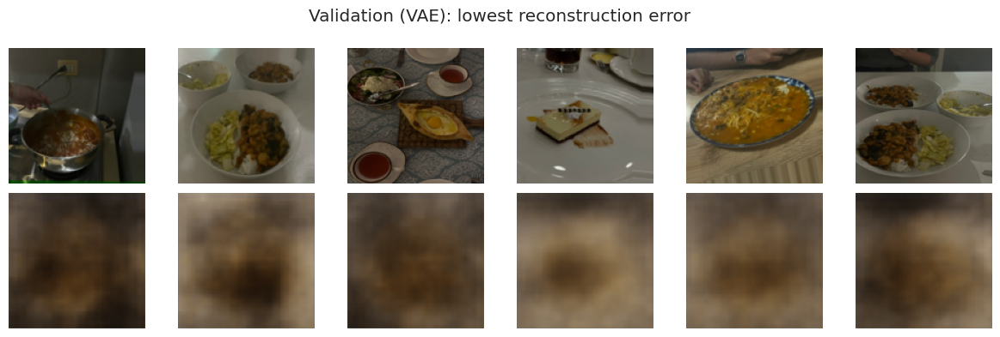

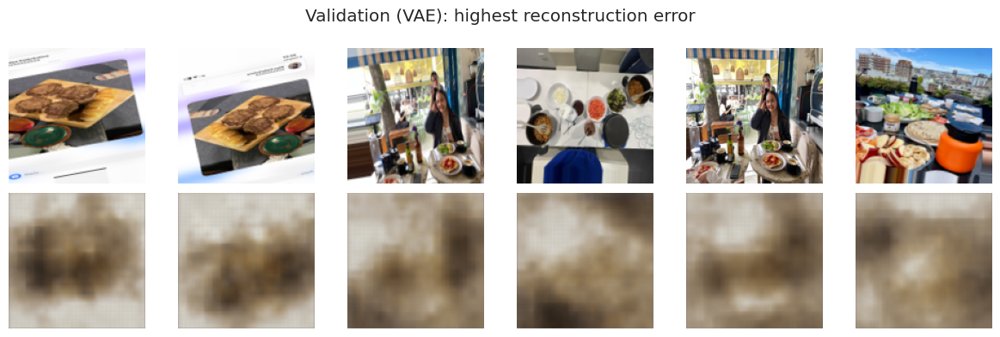

In [ ]:
# Best vs worst reconstructions (VAE)
def show_best_and_worst_vae(data, recons, mse, n_images=6, title_prefix="Val (VAE)"):
    sorted_idx = np.argsort(mse)
    best_idx   = sorted_idx[:n_images]
    worst_idx  = sorted_idx[-n_images:]

    # Best reconstructions
    plt.figure(figsize=(2*n_images, 4))
    for i, idx in enumerate(best_idx):
        # original
        plt.subplot(2, n_images, i + 1)
        plt.imshow(data[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        # recon
        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Recon")
    plt.suptitle(f"{title_prefix}: lowest reconstruction error")
    plt.tight_layout()
    plt.show()

    # Worst reconstructions
    plt.figure(figsize=(2*n_images, 4))
    for i, idx in enumerate(worst_idx):
        # original
        plt.subplot(2, n_images, i + 1)
        plt.imshow(data[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Original")

        # recon
        plt.subplot(2, n_images, n_images + i + 1)
        plt.imshow(recons[idx])
        plt.axis("off")
        if i == 0:
            plt.ylabel("Recon")
    plt.suptitle(f"{title_prefix}: highest reconstruction error")
    plt.tight_layout()
    plt.show()

# Run on validation set
show_best_and_worst_vae(X_val_vae, recons_val_vae, mse_val_vae, n_images=6, title_prefix="Validation (VAE)")

When I look at the lowest-error VAE reconstructions, the pattern is surprisingly consistent. These images tend to be visually uniform (smooth lighting, fewer objects, and overall low variation in color and texture). In contrast, the highest-error examples are the ones with a lot of visual diversity: plates on colorful tables, many small objects, outdoor backgrounds, hands, text, and sharp edges.

The VAE struggles to represent all of this detail inside its limited latent space, so the reconstructions collapse into abstract brownish textures with almost no spatial structure. Compared with the CAE, the VAE performs worse overall. The gap between simple and complex images becomes larger, and even the “best” reconstructions are blurrier. This reinforces the idea that while the VAE produces a smoother latent space, it does so at the cost of reconstruction fidelity.

Before comparing the CAE and the VAE in a more structured way, I wanted to understand what their latent spaces actually look like.

In [ ]:
# Get latent codes for ALL images

# CAE latent codes (shape: N x latent_dim)
Z_cae_all = encoder.predict(X_all, batch_size=64)
print("Z_cae_all shape:", Z_cae_all.shape)

# VAE latent codes: use z_mean as deterministic embedding
z_mean_all, z_log_var_all, z_all = vae_encoder.predict(X_all, batch_size=64)
Z_vae_all = z_mean_all
print("Z_vae_all shape:", Z_vae_all.shape)

27/27 ━━━━━━━━━━━━━━━━━━━━ 17s 609ms/step
Z_cae_all shape: (1707, 64)
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 412ms/step
Z_vae_all shape: (1707, 16)


In [ ]:
# Standardize latent codes
scaler_cae = StandardScaler()
Z_cae_scaled = scaler_cae.fit_transform(Z_cae_all)

scaler_vae = StandardScaler()
Z_vae_scaled = scaler_vae.fit_transform(Z_vae_all)

print("Z_cae_scaled:", Z_cae_scaled.shape)
print("Z_vae_scaled:", Z_vae_scaled.shape)

Z_cae_scaled: (1707, 64)
Z_vae_scaled: (1707, 16)


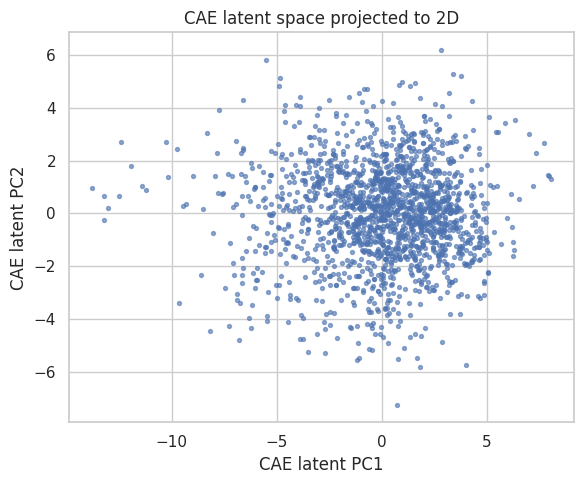

In [ ]:
# PCA to 2D for CAE latent space
pca_cae = PCA(n_components=2, random_state=42)
Z_cae_2d = pca_cae.fit_transform(Z_cae_scaled)

plt.figure(figsize=(6,5))
plt.scatter(Z_cae_2d[:,0], Z_cae_2d[:,1], s=8, alpha=0.6)
plt.xlabel("CAE latent PC1")
plt.ylabel("CAE latent PC2")
plt.title("CAE latent space projected to 2D")
plt.tight_layout()
plt.show()

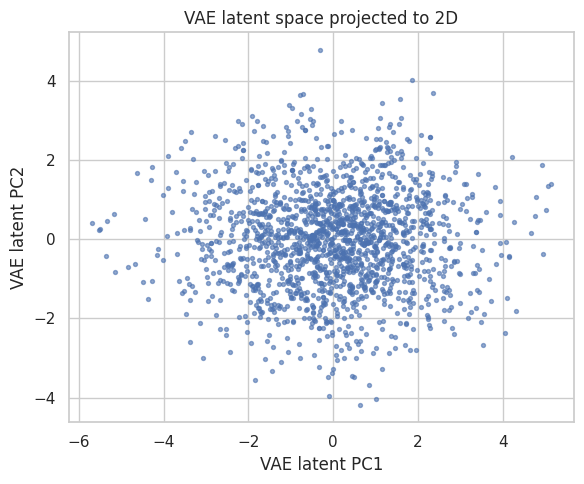

In [ ]:
# PCA to 2D for VAE latent space
pca_vae = PCA(n_components=2, random_state=42)
Z_vae_2d = pca_vae.fit_transform(Z_vae_scaled)

plt.figure(figsize=(6,5))
plt.scatter(Z_vae_2d[:,0], Z_vae_2d[:,1], s=8, alpha=0.6)
plt.xlabel("VAE latent PC1")
plt.ylabel("VAE latent PC2")
plt.title("VAE latent space projected to 2D")
plt.tight_layout()
plt.show()

The CAE’s latent space in 2D looks fairly broad and uneven, with points spreading out in several directions and forming a slightly elongated cloud. This makes sense given the CAE’s deterministic nature. It compresses each image into a single point with no regularization penalty pushing the embedding toward any particular geometry. The spread along the first principal component suggests that the CAE is especially sensitive to one dominant dimension of variation in my dataset, probably something like lighting/style differences across photos.


The VAE’s latent space looks more compact and more symmetric. Because a VAE is trained with a KL-divergence term that encourages the posterior distribution to match a standard normal prior, its embeddings tend to form a dense, rounded cloud instead of spreading across arbitrary directions. In the plot, most points cluster around the origin, and the distribution looks close to elliptical or even isotropic. This regular shape means the VAE is learning a smooth and structured representation where similar images are encouraged to stay close together.

Before clustering the VAE latent codes, I wanted to understand whether the latent space actually contains any meaningful structure that k-means could pick up. Since the latent vectors are 16-dimensional, it’s hard to judge this directly, so the next step is to systematically test different values of k and evaluate how well they partition the latent space.

To do this, I run k-means for k=3 to k=10, and for each value compute two standard metrics: inertia, which measures within-cluster compactness, and the silhouette score, which measures how well-separated the clusters are.

k=3: inertia=23179.37, silhouette=0.0760
k=4: inertia=22226.39, silhouette=0.0704
k=5: inertia=21467.35, silhouette=0.0645
k=6: inertia=20925.98, silhouette=0.0609
k=7: inertia=20483.07, silhouette=0.0554
k=8: inertia=20095.06, silhouette=0.0550
k=9: inertia=19744.46, silhouette=0.0573
k=10: inertia=19383.40, silhouette=0.0543


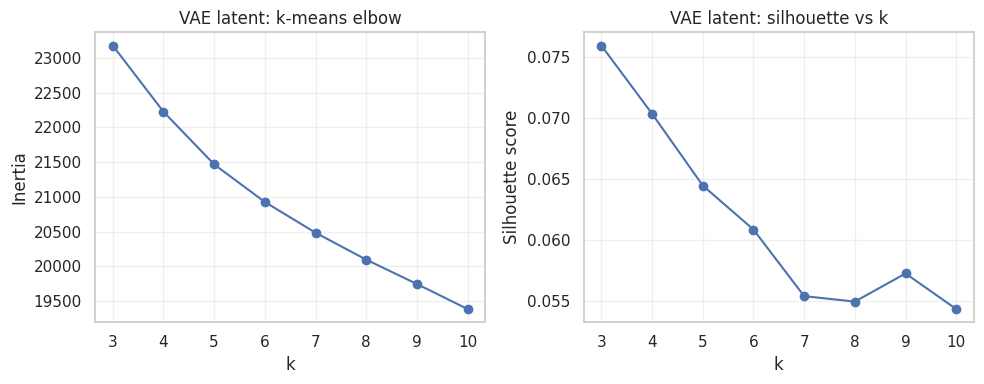

Chosen k for VAE latent clustering: 3


In [ ]:
# Try different k on VAE latent space
k_values = list(range(3, 11))
inertias_vae = []
sils_vae = []

for k in k_values:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(Z_vae_scaled)
    inertias_vae.append(km.inertia_)
    sil = silhouette_score(Z_vae_scaled, labels)
    sils_vae.append(sil)
    print(f"k={k}: inertia={km.inertia_:.2f}, silhouette={sil:.4f}")

# Plot elbow + silhouette
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].plot(k_values, inertias_vae, marker="o")
ax[0].set_xlabel("k")
ax[0].set_ylabel("Inertia")
ax[0].set_title("VAE latent: k-means elbow")

ax[1].plot(k_values, sils_vae, marker="o")
ax[1].set_xlabel("k")
ax[1].set_ylabel("Silhouette score")
ax[1].set_title("VAE latent: silhouette vs k")

for a in ax:
    a.grid(alpha=0.3)

plt.tight_layout()
plt.show()

best_k_vae = k_values[int(np.argmax(sils_vae))]
print("Chosen k for VAE latent clustering:", best_k_vae)

The elbow curve shows the expected pattern: inertia steadily decreases as k increases, but there is no sharp bend suggesting a natural number of clusters. The silhouette curve provides a much clearer picture. It peaks at  k=3 with a score of about 0.076, and then consistently declines as k increases. While the values are overall quite small (indicating weak separation), the relative maximum at k=3 suggests that this is the most coherent clustering the VAE latent space can produce.

After selecting k=3 as the most reasonable number of clusters for the VAE latent space, the next step is to fit a final k-means model using this value and apply it to the full set of scaled latent vectors.

In [ ]:
# Fit final k-means on VAE latent space
kmeans_vae = KMeans(n_clusters=best_k_vae, random_state=42, n_init=10)
cluster_labels_vae = kmeans_vae.fit_predict(Z_vae_scaled)

print("Cluster counts (VAE latent):", np.bincount(cluster_labels_vae))

Cluster counts (VAE latent): [495 625 587]


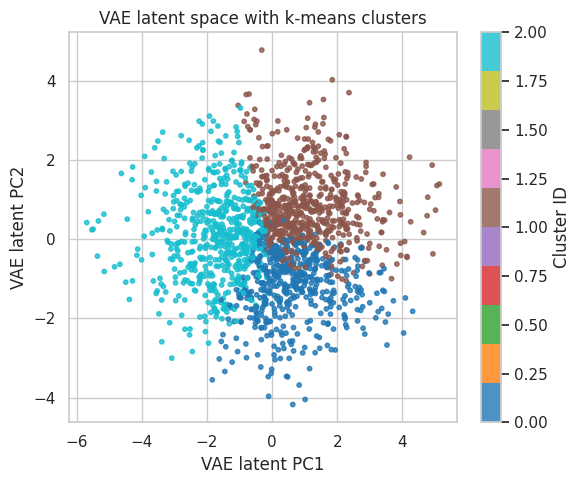

In [ ]:
# Visualize VAE latent PCs colored by cluster
plt.figure(figsize=(6,5))
sc = plt.scatter(Z_vae_2d[:,0], Z_vae_2d[:,1],
                 c=cluster_labels_vae, cmap="tab10", s=10, alpha=0.8)
plt.xlabel("VAE latent PC1")
plt.ylabel("VAE latent PC2")
plt.title("VAE latent space with k-means clusters")
plt.colorbar(sc, label="Cluster ID")
plt.tight_layout()
plt.show()

The scatter plot makes it pretty clear that the three clusters overlap quite a bit, but they still fall into loose regions rather than being completely mixed together. This matches what the silhouette scores already suggested that the separation isn’t very strong. Even so, each cluster forms its own “cloud” with a slightly different shape and location, which means that the VAE is capturing some visual structure in the images. One group leans more toward the negative side of PC1, another stretches upward along PC2, and the third sits more toward the right. So even though the boundaries aren’t sharp, there’s still enough structure for k-means to pick up on. The cluster counts (around 495, 625, and 587 images) are also pretty balanced, which suggests that the latent space isn’t collapsing into a single dominant region but is spreading the data out in a relatively even way.

Now, let's look at the sample images.

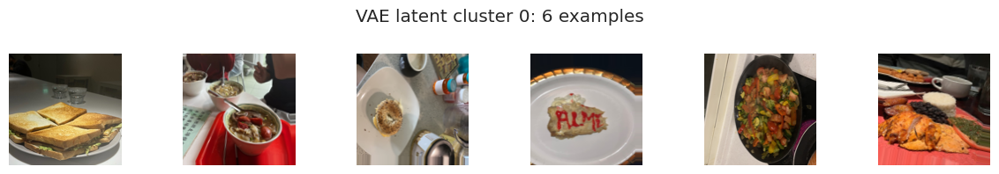

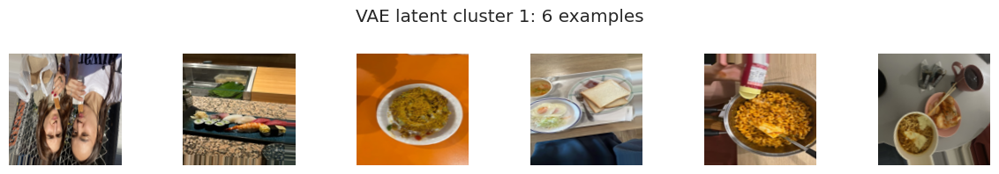

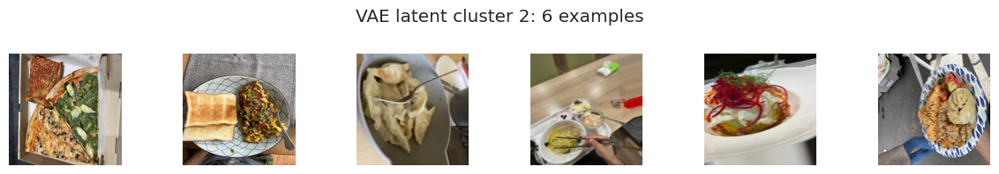

In [ ]:
def show_cluster_examples_vae(cluster_id, n_examples=8):
    """
    Visualize some original images belonging to a given VAE latent cluster.
    """
    idx = np.where(cluster_labels_vae == cluster_id)[0]
    if len(idx) == 0:
        print(f"No images in cluster {cluster_id}")
        return

    n_show = min(n_examples, len(idx))
    chosen = np.random.choice(idx, size=n_show, replace=False)

    plt.figure(figsize=(2*n_show, 2))
    for i, img_idx in enumerate(chosen):
        plt.subplot(1, n_show, i + 1)
        plt.imshow(X_all[img_idx])
        plt.axis("off")
    plt.suptitle(f"VAE latent cluster {cluster_id}: {n_show} examples")
    plt.tight_layout()
    plt.show()

# first 3 clusters
for cid in range(min(best_k_vae, 3)):
    show_cluster_examples_vae(cid, n_examples=6)

Cluster 0 mostly contains simpler, close-up dishes with centered compositions and fewer distracting backgrounds. Cluster 1 includes more context-rich images, like hands, utensils, and multi-item trays, suggesting the VAE might be reacting to layout complexity or the presence of multiple objects. Cluster 2 seems to mix brighter colors and more varied angles, which might explain why those images ended up forming their own region in the latent space. Even though the boundaries are blurry, the examples show that the VAE is picking up on recurring structures like plating style, zoom level, and background clutter—just not strongly enough to create completely distinct categories.

Now, I will do a quick interpolation experiment. I will take two real images, encode them into latent vectors, and then slide from one vector to the other in small steps.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


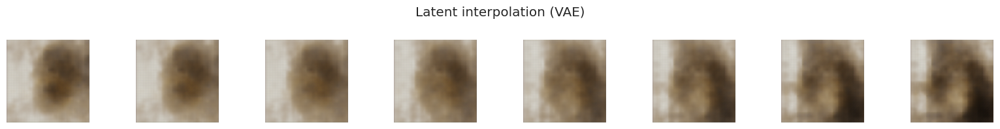

In [ ]:
# Interpolate between two images in VAE latent space
def interpolate_between_images(idx1, idx2, n_steps=8):
    """
    Pick two images by index in X_all, encode them, and interpolate
    in latent space, decoding each step.
    """
    x1 = X_all[idx1:idx1+1]
    x2 = X_all[idx2:idx2+1]

    z1, _, _ = vae_encoder.predict(x1)
    z2, _, _ = vae_encoder.predict(x2)

    z1 = z1[0]
    z2 = z2[0]

    alphas = np.linspace(0.0, 1.0, n_steps)
    z_interp = np.array([(1-a)*z1 + a*z2 for a in alphas])

    x_interp = vae_decoder.predict(z_interp)

    plt.figure(figsize=(2*n_steps, 2))
    for i in range(n_steps):
        plt.subplot(1, n_steps, i + 1)
        plt.imshow(x_interp[i])
        plt.axis("off")
    plt.suptitle("Latent interpolation (VAE)")
    plt.tight_layout()
    plt.show()

# interpolate between two random images
i1, i2 = np.random.choice(len(X_all), size=2, replace=False)
interpolate_between_images(i1, i2, n_steps=8)

The results here are extremely blurry, but the progression is still smooth. Each frame looks like a slightly shifted version of the previous one, which means the VAE is doing what it’s supposed to. It learned a continuous manifold where nearby points decode to similar blobs. This confirms that the model has a continuous representation but lacks the expressive power to produce sharp samples.

## Conclusion

This project's goal was to analyze whether meaningful structure could be extracted from a highly varied collection of personal food photographs. Starting with exploratory data analysis and simple handcrafted features allowed me to establish a clear understanding of the dataset’s characteristics before introducing any complex models. This initial step demonstrated that the images varied widely in color, composition, and visual complexity, which made it important to anchor the project with a baseline approach. Applying PCA and k-means to these basic features showed the limitations of traditional methods. Although some weak groupings appeared, the clusters lacked coherence.

Building on this baseline, I introduced two autoencoder models: a Convolutional Autoencoder (CAE) and a Variational Autoencoder (VAE) to learn more structured latent representations directly from the pixel data. Both models struggled with detailed reconstruction, especially for cluttered or textured images, but this behavior provided valuable information. The reconstruction-error analysis revealed consistent trends across models, with simpler images being easier to compress and reproduce, while more complex photographs generated higher errors. These results confirmed that the dataset contains meaningful variation and that the models were sensitive to it.

The latent-space analysis offered insight into model performance. When visualized in 2D using PCA, the CAE’s latent space appeared diffuse and loosely organized, whereas the VAE produced a more compact and continuous structure. Although k-means clusters remained overlapping in both cases, the VAE’s clusters showed slightly more stability, balance, and internal consistency, suggesting that the VAE captured higher-level patterns more effectively. Latent interpolations also behaved more smoothly under the VAE, indicating that it learned a better-behaved manifold rather than memorizing individual samples.

One of the reasons I chose this topic was because we briefly touched on autoencoders in class, and I wanted to push that idea much further in a real, self-contained project. Starting with a basic CAE let me anchor the work in something familiar, but I intentionally expanded the scope by layering in PCA, clustering, and most importantly, a full Variational Autoencoder. At the same time, clustering the latent spaces helped me go beyond reconstruction and look at the structure the models were actually learning. Combining PCA with k-means gave me a baseline reference point, and then comparing it to the latent spaces from the CAE and VAE helped me see how much richer the learned features were. This setup also opens a lot of room for growth.

Now that I’ve built a full VAE pipeline, I can extend this direction in Assignment 3 by moving toward more advanced generative models, such as β-VAE for better representations, VQ-VAE for discrete latent codes, or even diffusion models for higher-quality generation. I could also explore stronger encoders, like deeper CNNs or pretrained backbones, to push reconstruction quality and cluster separation further.

## AI Statement

AI was helpful in a lot of the ways for this assignment. I used it instead of Grammarly (because Grammarly did not run on Colab) to check spelling and restructure some paragraphs. I also offered better ways of writing certain paragraph to make it more comprehensive. However, no part of the paper was written by the AI, I simply used it to double check things. Initially, I also used AI to brainstorm topics because I changed the dataset. Another thing is that most of the code and models were not explicitly covered in class (including the math behind the models), so I used external sources to learn about it. I sent some of the sources to AI and I asked it to explain the concepts to me. I also double checked some of the code because the models were running very slowly at first and AI helped me tune them to make them more efficient. So, I used AI to enhance my learning and correct the minor mistakes to have a well-formatted and well-organized paper. ]

I also looked at some conversations with AI from before (when doing PCW, for example) because those chats already had some good explanations.

## References

GeeksforGeeks. (2020, July 20). Variational AutoEncoders. GeeksforGeeks. https://www.geeksforgeeks.org/machine-learning/variational-autoencoders/

How to Combine PCA & K-Means Clustering in Python – 365 Data Science. (2020, March 10). 365 Data Science. https://365datascience.com/tutorials/python-tutorials/pca-k-means/

Konstantin Sofeikov. (2023, April 25). Implementing Variational Autoencoders from scratch. Medium. https://medium.com/@sofeikov/implementing-variational-autoencoders-from-scratch-533782d8eb95

shuvostp. (2023, March 27). Convolutional Autoencoder for image Reconstruction. Kaggle.com; Kaggle. https://www.kaggle.com/code/shuvostp/convolutional-autoencoder-for-image-reconstruction